Assignment Part-I

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:

1. Which variables are significant in predicting the price of a house, and

2. How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression.

Business Goal 

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

In [307]:
#Ignoring warnings

import warnings
warnings.filterwarnings("ignore")

In [308]:
# Import all required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import GridSearchCV

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

### Reading and Preparing data

In [309]:
#Read data from downloaded file

house_data = pd.read_csv(r'C:\Users\ashwini.patil09\Downloads\train.csv')
house_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [310]:
#know shape of dataframe
house_data.shape

(1460, 81)

In [311]:
# get statistical description of columns of dataframe
house_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [312]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [313]:
# verify if no null values as per output of info statement
house_data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [314]:
#cheked any null column exist or not
nuni = house_data.nunique()
nuni[nuni==0]

Series([], dtype: int64)

In [315]:
#drop columns where maximum of the values are missing

house_data = house_data.drop(columns=['PoolQC','Fence', 'MiscFeature'])

In [316]:
house_data.info()     #81 columns now dropped to 78

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 78 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [317]:
# Lets check Alley as it has only 91 values and Fireplacequ as it has only 770 values
house_data.Alley.value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

In [318]:
house_data.FireplaceQu.value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [319]:
#Now lets check Missing values of columns
house_data.isnull().sum()[house_data.isnull().sum()>0]

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
dtype: int64

In [320]:
# 1369 out of 1460 values are missing. So lets drop it
house_data=house_data.drop(columns=['Alley'])

In [321]:
#Fireplacequ has lot of values so we cant drop it. lets replace Nan values of with NA i.e. No Fireplace 
house_data.FireplaceQu = house_data.FireplaceQu.fillna('NA')

In [322]:
#lets check missing values again
house_data.isnull().sum()[house_data.isnull().sum()>0]

LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

In [323]:
#now lets check LotFrontage for its unique values
house_data.LotFrontage.value_counts()

60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
        ... 
137.0      1
141.0      1
38.0       1
140.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64

In [324]:
#check median of LotFrontage
LotFrontage_median = house_data.LotFrontage.median()
LotFrontage_median

69.0

In [325]:
#replace missing values of LotFrontage with median due to some outliers in data shown from Descibe section
house_data.LotFrontage = house_data.LotFrontage.fillna(LotFrontage_median)

In [326]:
#similarly replace missing values of MasVnrArea with median due to some outliers in data shown from Descibe section
house_data.MasVnrArea = house_data.MasVnrArea.fillna(house_data.MasVnrArea.median())    

In [327]:
#replace Nan values of MasVnrArea with None i.e. No Masonary type
house_data.MasVnrType = house_data.MasVnrType.fillna('None')

In [328]:
#replace Nan values of BsmtQual with NA i.e. No Basement
house_data.BsmtQual = house_data.BsmtQual.fillna('NA')

In [329]:
#replace Nan values of BsmtCond with NA i.e. No Basement
house_data.BsmtCond = house_data.BsmtCond.fillna('NA')

In [330]:
#replace Nan values of BsmtExposure with No i.e. No Exposure
house_data.BsmtExposure = house_data.BsmtExposure.fillna('No')

In [331]:
#replace Nan values of BsmtFinType1 with NA i.e. No Basement
house_data.BsmtFinType1 = house_data.BsmtFinType1.fillna('NA')

In [332]:
#replace Nan values of BsmtFinType2 with NA i.e. No Basement
house_data.BsmtFinType2 = house_data.BsmtFinType2.fillna('NA')

In [333]:
#impute missing values of Electrical with mode due to categorical column
house_data.Electrical = house_data.Electrical.fillna(house_data.Electrical.mode()[0])

In [334]:
#replace Nan values of GarageType with NA i.e. No Garage
house_data.GarageType = house_data.GarageType.fillna('NA')

In [335]:
#replace Nan values of GarageYrBlt with 0 i.e. No Garage
house_data.GarageYrBlt = house_data.GarageYrBlt.fillna(0)

In [336]:
#replace Nan values of GarageFinish with NA i.e. No Garage
house_data.GarageFinish = house_data.GarageFinish.fillna('NA')

In [337]:
#replace Nan values of GarageQual with NA i.e. No Garage
house_data.GarageQual = house_data.GarageQual.fillna('NA')

In [338]:
#replace Nan values of GarageFinish with NA i.e. No Garage
house_data.GarageQual = house_data.GarageQual.fillna('NA')

In [339]:
#replace Nan values of GarageCond with NA i.e. No Garage
house_data.GarageCond = house_data.GarageCond.fillna('NA')

In [340]:
#now that we have replaced all missing values, lets check if anything missing again
house_data.isnull().sum()[house_data.isnull().sum()>0]

Series([], dtype: int64)

In [341]:
#calculate how old is the house i.e. HouseAge from YrSold - YearBuilt  and then drop these two columns as we dont need them in our analysis
house_data['HouseAge'] = house_data.YrSold - house_data.YearBuilt
house_data=house_data.drop(columns=['YrSold', 'YearBuilt'])

In [342]:
#convert MSSubClass into object type 
convert_dict = {'MSSubClass':object}
house_data = house_data.astype(convert_dict)

In [343]:
#Convert all categorical vars to numeric vars

In [344]:
#convert ExterQual 1,2,3,4 -> Fa, TA, Gd, Ex
house_data = house_data.replace({'ExterQual':{'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}})

In [345]:
#convert BsmtQual 0,1,2,3,4,5 -> NA, Fa, TA, Gd, Ex
house_data = house_data.replace({'BsmtQual':{'NA':0,'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}})

In [346]:
#convert BsmtExposure 0,1,2,3,4 -> NA, No, Mn, Av, gd
house_data = house_data.replace({'BsmtExposure':{'NA':0, 'No':1,'Mn':2, 'Av':3, 'Gd':4}})

In [347]:
#convert BsmtFinType1 0,1,2,3,4,5,6 -> NA, Unf, LwQ, Rec, BLQ, ALQ, GLQ
house_data = house_data.replace({'BsmtFinType1':{'NA':0,'Unf':1,'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}})

In [348]:
#convert HeatingQC 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'HeatingQC':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [349]:
#convert KitchenQual 1,2,3,4,5 -> Fa, TA, Gd, Ex
house_data = house_data.replace({'KitchenQual':{'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}})

In [350]:
#convert FireplaceQu 0,1,2,3,4,5 -> NA, Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'FireplaceQu':{'NA':0,'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [351]:
house_data.ExterQual.value_counts()

2    906
3    488
4     52
1     14
Name: ExterQual, dtype: int64

In [352]:
house_data.info() #all rows have now values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearRemo

In [353]:
# now lets calculate the relative frequencies of the unique values for all columns. More the frequency means higher the bias
for c in house_data.columns:
    if house_data[c].dtype == np.object :
        print(c)
        print(house_data[c].value_counts(normalize=True))

MSSubClass
20     0.367123
60     0.204795
50     0.098630
120    0.059589
30     0.047260
160    0.043151
70     0.041096
80     0.039726
90     0.035616
190    0.020548
85     0.013699
75     0.010959
45     0.008219
180    0.006849
40     0.002740
Name: MSSubClass, dtype: float64
MSZoning
RL         0.788356
RM         0.149315
FV         0.044521
RH         0.010959
C (all)    0.006849
Name: MSZoning, dtype: float64
Street
Pave    0.99589
Grvl    0.00411
Name: Street, dtype: float64
LotShape
Reg    0.633562
IR1    0.331507
IR2    0.028082
IR3    0.006849
Name: LotShape, dtype: float64
LandContour
Lvl    0.897945
Bnk    0.043151
HLS    0.034247
Low    0.024658
Name: LandContour, dtype: float64
Utilities
AllPub    0.999315
NoSeWa    0.000685
Name: Utilities, dtype: float64
LotConfig
Inside     0.720548
Corner     0.180137
CulDSac    0.064384
FR2        0.032192
FR3        0.002740
Name: LotConfig, dtype: float64
LandSlope
Gtl    0.946575
Mod    0.044521
Sev    0.008904
Name: LandSlop

In [354]:
#we will Drop columns with more than 80% relative frequencies
house_data=house_data.drop(columns=['Id','Street', 'LandContour', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'BsmtCond'
                                    ,'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageQual', 'GarageCond'
                                    , 'PavedDrive', 'Condition1', 'BldgType', 'ExterCond', 'BsmtFinType2', 'SaleType'
                                    , 'SaleCondition'])

In [355]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 55 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   object 
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LotConfig      1460 non-null   object 
 6   Neighborhood   1460 non-null   object 
 7   HouseStyle     1460 non-null   object 
 8   OverallQual    1460 non-null   int64  
 9   OverallCond    1460 non-null   int64  
 10  YearRemodAdd   1460 non-null   int64  
 11  RoofStyle      1460 non-null   object 
 12  Exterior1st    1460 non-null   object 
 13  Exterior2nd    1460 non-null   object 
 14  MasVnrType     1460 non-null   object 
 15  MasVnrArea     1460 non-null   float64
 16  ExterQual      1460 non-null   int64  
 17  Foundation     1460 non-null   object 
 18  BsmtQual

In [356]:
#Get all object type columns
object_columns = []
for c in house_data.columns:
    if house_data[c].dtype == np.object:
        object_columns.append(c)
print(object_columns)

['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'GarageType', 'GarageFinish']


### Create Dummy Varibales

In [357]:
# create dummy variable for MSSubClass
MSSubClass_df = pd.get_dummies(house_data['MSSubClass'],drop_first=True, prefix='MSSubClass')
#concat MSSubClass_df with main house_data df
house_data = pd.concat([house_data,MSSubClass_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [358]:
#create dummy variable for MSZoning
MSZoning_df = pd.get_dummies(house_data['MSZoning'],drop_first=True, prefix='MSZoning')
MSZoning_df.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
3,0,0,1,0
4,0,0,1,0


In [359]:
#concat MSZoning_df with main house_data df
house_data = pd.concat([house_data,MSZoning_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


In [360]:
#create dummy variable for LotShape
LotShape_df = pd.get_dummies(house_data['LotShape'],drop_first=True, prefix='LotShape')

In [361]:
#concat LotShape_df with main house_data df
house_data = pd.concat([house_data,LotShape_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [362]:
#create dummy variable for LotConfig
LotConfig_df = pd.get_dummies(house_data['LotConfig'],drop_first=True, prefix='LotConfig')

In [363]:
#concat LotConfig_df with main house_data df
house_data = pd.concat([house_data,LotConfig_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0


In [364]:
#create dummy variable for LotShape
Neighborhood_df = pd.get_dummies(house_data['Neighborhood'],drop_first=True, prefix='Neighborhood')
#concat LotConfig_df with main house_data df
house_data = pd.concat([house_data,Neighborhood_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [365]:
#create dummy variable for HouseStyle
HouseStyle_df = pd.get_dummies(house_data['HouseStyle'],drop_first=True, prefix='HouseStyle')
#concat HouseStyle_df with main house_data df
house_data = pd.concat([house_data,HouseStyle_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [366]:
#create dummy variable for RoofStyle
RoofStyle_df = pd.get_dummies(house_data['RoofStyle'],drop_first=True, prefix='RoofStyle')
#concat RoofStyle_df with main house_data df
house_data = pd.concat([house_data,RoofStyle_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0


In [367]:
#create dummy variable for Exterior1st
Exterior1st_df = pd.get_dummies(house_data['Exterior1st'],drop_first=True, prefix='Exterior1st')
#concat Exterior1st_df with main house_data df
house_data = pd.concat([house_data,Exterior1st_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [368]:
#create dummy variable for Exterior2nd
Exterior2nd_df = pd.get_dummies(house_data['Exterior2nd'],drop_first=True, prefix='Exterior2nd')
#concat Exterior2nd_df with main house_data df
house_data = pd.concat([house_data,Exterior2nd_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0

In [369]:
#create dummy variable for MasVnrType
MasVnrType_df = pd.get_dummies(house_data['MasVnrType'],drop_first=True, prefix='MasVnrType')
#concat MasVnrType_df with main house_data df
house_data = pd.concat([house_data,MasVnrType_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,3,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,3,Attchd,2000.

In [370]:
#create dummy variable for Foundation
Foundation_df = pd.get_dummies(house_data['Foundation'],drop_first=True, prefix='Foundation')
#concat Foundation_df with main house_data df
house_data = pd.concat([house_data,Foundation_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8

In [371]:
#create dummy variable for GarageType
GarageType_df = pd.get_dummies(house_data['GarageType'],drop_first=True, prefix='GarageType')
#concat GarageType_df with main house_data df
house_data = pd.concat([house_data,GarageType_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [372]:
#create dummy variable for GarageFinish
GarageFinish_df = pd.get_dummies(house_data['GarageFinish'],drop_first=True, prefix='GarageFinish')
#concat GarageFinish_df with main house_data df
house_data = pd.concat([house_data,GarageFinish_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,3,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,3,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,3,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,2,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,3,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,3,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,2,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,3,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,

In [373]:
house_data.shape

(1460, 162)

In [374]:
#Drop categorical variables after ceating dummy varaibles
house_data=house_data.drop(columns=['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'HouseStyle'
                                    , 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
                                    'GarageType', 'GarageFinish'])

In [375]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 149 entries, LotFrontage to GarageFinish_Unf
dtypes: float64(3), int64(39), uint8(107)
memory usage: 631.7 KB


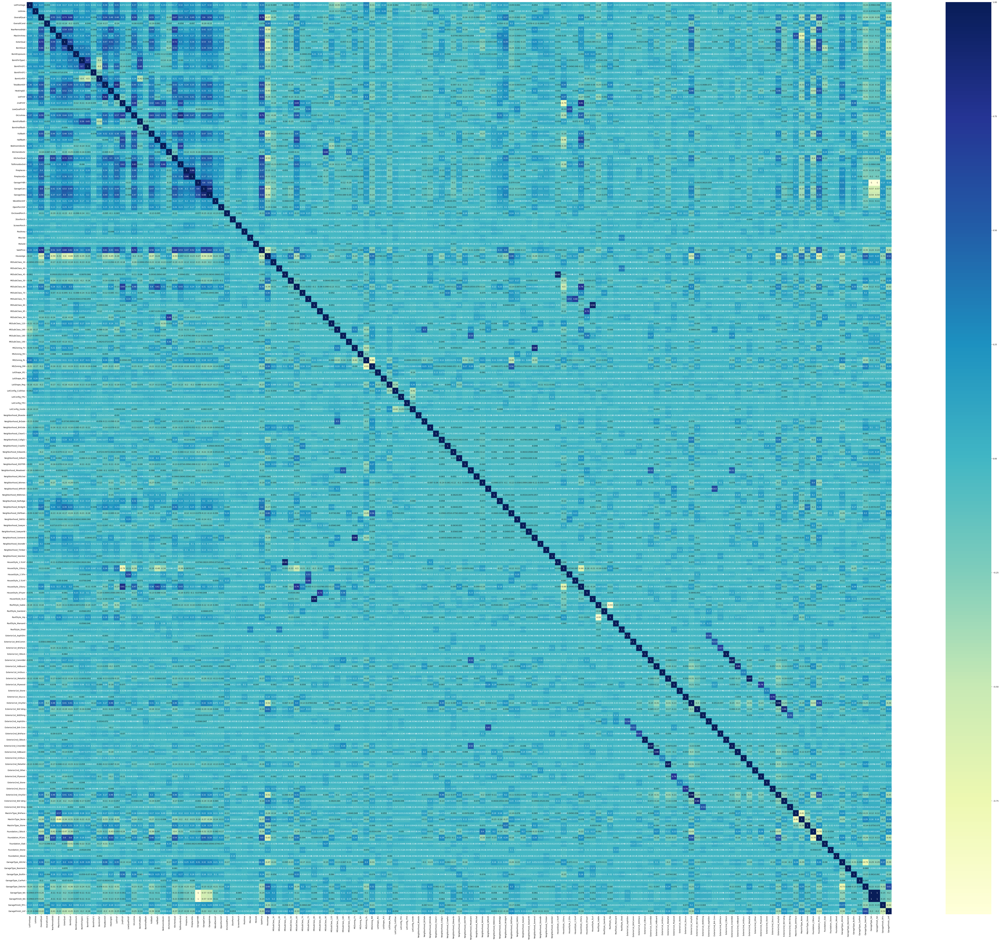

In [376]:
#check the correaltion with new columns using heatmap
plt.figure(figsize=(100,85))
sns.heatmap(house_data.corr(), annot =True, cmap="YlGnBu")
plt.show()

### Test and Train Data Preparation

In [377]:
df_train,df_test = train_test_split(house_data,train_size=0.70,random_state=100)
print(df_train.shape)
print(df_test.shape)

(1021, 149)
(439, 149)


In [378]:
df_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,102

### Rescalling The Numeric Factors for better fitment and readability in visualization

In [379]:
#instantiate the object
scaler = StandardScaler()

#create list of numeric variables
num_vars = ['LotFrontage','LotArea','OverallQual','OverallCond','YearRemodAdd','MasVnrArea', 'ExterQual', 'BsmtQual'
            , 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'TotalBsmtSF'
           , 'HeatingQC', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath'
            , 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces'
           , 'FireplaceQu', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch'
           , '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'HouseAge']

#fit on data
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
318,0.925326,-0.057261,0.648310,-0.532073,0.389207,0.809137,1.051361,0.614716,2.181065,1.138412,1.159065,-0.293313,-0.454262,0.621091,0.871757,0.511410,2.137583,-0.124502,2.121655,1.066863,-0.247791,0.784821,1.244440,1.395790,-0.234155,0.741868,1.555150,0.622148,0.658513,0.274068,1.646935,0.867501,1.988123,0.195951,1.912645,-0.121922,-0.275126,-0.062302,-0.084263,-0.833178,260000,-0.675791,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
239,-0.795709,-0.169753,-0.066511,-1.448170,-1.698692,-0.558025,-0.699764,-0.635533,-0.653302,-0.753845,-0.761831,-0.293313,0.172244,-0.712611,-1.181447,-0.931882,0.793638,-0.124502,-0.058599,-0.837450,-0.247791,-1.028080,1.244440,0.175669,-0.234155,-0.776063,0.308833,0.622148,1.206469,0.177351,-1.034916,-1.188045,-0.744598,1.405086,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.833178,113000,0.939707,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
986,-0.478677,-0.502762,-0.066511,2.216221,0.874765,-0.558025,-0.699764,-0.635533,-0.653302,-1.226909,-0.964030,-0.293313,-0.175567,-1.257424,-0.154845,-0.421449,0.667284,-0.124502,0.219811,-0.837450,-0.247791,-1.028080,-0.753316,-1.044452,-0.234155,0.741868,-0.937484,-0.927153,-0.985354,0.179549,-1.034916,-1.023035,2.422143,-0.710899,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.10

In [380]:
df_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.00000

### Train the model

In [381]:
#create X_train,y_train 
#cnt is out Target/dependent Variable
y_train = df_train.pop('SalePrice')
X_train = df_train

In [382]:
X_train.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1',
       ...
       'Foundation_Wood', 'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn', 'GarageType_CarPort', 'GarageType_Detchd', 'GarageType_NA', 'GarageFinish_NA', 'GarageFinish_RFn', 'GarageFinish_Unf'], dtype='object', length=148)

### Recursive Feature Elimination - to remove unwanted variables

In [383]:
#Running RFE with the out variables equals to 15
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(estimator=lm, n_features_to_select=35)
rfe = rfe.fit(X_train,y_train)

In [384]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 45),
 ('LotArea', False, 7),
 ('OverallQual', True, 1),
 ('OverallCond', False, 103),
 ('YearRemodAdd', False, 92),
 ('MasVnrArea', False, 91),
 ('ExterQual', False, 57),
 ('BsmtQual', False, 38),
 ('BsmtExposure', False, 80),
 ('BsmtFinType1', False, 84),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', False, 21),
 ('BsmtUnfSF', False, 15),
 ('TotalBsmtSF', False, 14),
 ('HeatingQC', False, 97),
 ('1stFlrSF', True, 1),
 ('2ndFlrSF', True, 1),
 ('LowQualFinSF', False, 18),
 ('GrLivArea', False, 16),
 ('BsmtFullBath', False, 83),
 ('BsmtHalfBath', False, 89),
 ('FullBath', False, 109),
 ('HalfBath', False, 105),
 ('BedroomAbvGr', False, 106),
 ('KitchenAbvGr', False, 12),
 ('KitchenQual', True, 1),
 ('TotRmsAbvGrd', False, 101),
 ('Fireplaces', False, 110),
 ('FireplaceQu', False, 94),
 ('GarageYrBlt', True, 1),
 ('GarageCars', True, 1),
 ('GarageArea', False, 88),
 ('WoodDeckSF', False, 34),
 ('OpenPorchSF', False, 111),
 ('EnclosedPorch', False, 108),
 ('3SsnPorch', 

In [385]:
#selected columns from rfe
col = X_train.columns[rfe.support_]
col

Index(['OverallQual', 'BsmtFinSF1', '1stFlrSF', '2ndFlrSF', 'KitchenQual', 'GarageYrBlt', 'GarageCars', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'HouseStyle_1Story', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'RoofStyle_Gambrel', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_CemntBd', 'Exterior1st_HdBoard', 'Exterior1st_ImStucc', 'Exterior1st_Plywood', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior2nd_AsphShn', 'Exterior2nd_BrkFace', 'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 'Exterior2nd_ImStucc', 'Exterior2nd_Plywood', 'Exterior2nd_Stone', 'GarageType_CarPort', 'GarageType_NA', 'GarageFinish_NA'], dtype='object')

In [386]:
#skipped columns from rfe
X_train.columns[~rfe.support_]

Index(['LotFrontage', 'LotArea', 'OverallCond', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF2',
       ...
       'Foundation_PConc', 'Foundation_Slab', 'Foundation_Stone', 'Foundation_Wood', 'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn', 'GarageType_Detchd', 'GarageFinish_RFn', 'GarageFinish_Unf'], dtype='object', length=113)

### Model with Statsmodel for details

In [387]:
#ceatinf X_train with RFE selected columns
X_train_rfe = X_train[col]

In [388]:
#adding a constant variable
X_train_rfe = sm.add_constant(X_train_rfe)

In [389]:
#create a RFE model
lm = sm.OLS(y_train,X_train_rfe).fit()  #Running the linear Model

In [390]:
#Get the Summary of Linear Model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     121.8
Date:                Fri, 21 Apr 2023   Prob (F-statistic):          4.62e-321
Time:                        12:22:56   Log-Likelihood:                -12135.
No. Observations:                1021   AIC:                         2.434e+04
Df Residuals:                     987   BIC:                         2.450e+04
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.669e+05   8136.749     20.513      0.000    1.51e+05    1.83e+05
OverallQual           2.904e+04   1906.069     15.237      0.000    2.53e+04    3.28e+04
BsmtFinSF1            9967.8138   1307.551      7.623      0.000    7401.915    1.25e+04
1stFlrSF              2.061e+04   1720.626     11.976      0.000    1.72e+04     2.4e+04
2ndFlrSF              2.469e+04   1995.212     12.372      0.000    2.08e+04    2.86e+04
KitchenQual           1.086e+04   1650.487      6.579      0.000    7619.931    1.41e+04
GarageYrBlt           2.954e+04   3.23e+04      0.915      0.360   -3.38e+04    9.29e+04
GarageCars             1.38e+04   1938.383      7.121      0.000    9999.626    1.76e+04
MSSubClass_120        -1.38e+04   5095.570     -2.708      0.007   -2.38e+04   -3798.744
MSSubClass_180        2.843e+04   1.61e+04      1.770      0.077   -3083.080       6e+04
MSZoning_RM          -1.371e+04   3618.596     -3.789      0.000   -2.08e+04   -6608.313
LotShape_IR3         -3.405e+04   1.23e+04     -2.770      0.006   -5.82e+04   -9925.759
Neighborhood_Crawfor  2.093e+04   6813.795      3.072      0.002    7559.641    3.43e+04
Neighborhood_SawyerW -1.329e+04   5588.008     -2.378      0.018   -2.43e+04   -2321.937
HouseStyle_1Story     1.855e+04   4022.525      4.613      0.000    1.07e+04    2.64e+04
HouseStyle_2.5Fin    -1.219e+04   1.85e+04     -0.659      0.510   -4.85e+04    2.41e+04
HouseStyle_2.5Unf    -1.961e+04   1.32e+04     -1.484      0.138   -4.55e+04    6312.987
RoofStyle_Gambrel      1.28e+04   2.09e+04      0.611      0.541   -2.83e+04    5.39e+04
Exterior1st_AsphShn  -2.382e+04   1.81e+04     -1.316      0.188   -5.93e+04    1.17e+04
Exterior1st_BrkComm  -2.294e+04   2.55e+04     -0.901      0.368   -7.29e+04     2.7e+04
Exterior1st_CemntBd  -4.947e+04    2.6e+04     -1.904      0.057      -1e+05    1522.678
Exterior1st_HdBoard  -1.358e+04   8009.703     -1.695      0.090   -2.93e+04    2139.326
Exterior1st_ImStucc  -6.568e+04   3.87e+04     -1.697      0.090   -1.42e+05    1.03e+04
Exterior1st_Plywood  -1.538e+04   7763.848     -1.981      0.048   -3.06e+04    -147.004
Exterior1st_Stone    -4.561e+04   2.86e+04     -1.596      0.111   -1.02e+05    1.05e+04
Exterior1st_Stucco   -3.477e+04   8498.267     -4.092      0.000   -5.15e+04   -1.81e+04
Exterior2nd_AsphShn  -2.382e+04   1.81e+04     -1.316      0.188   -5.93e+04    1.17e+04
Exterior2nd_BrkFace   1.517e+04   9242.743      1.641      0.101   -2966.132    3.33e+04
Exterior2nd_CmentBd   5.171e+04    2.6e+04      1.988      0.047     667.737    1.03e+05
Exterior2nd_HdBoard   1.222e+04   8145.901      1.500      0.134   -3770.146    2.82e+04
Exterior2nd_ImStucc   3.795e+04   1.45e+04      2.623      0.009    9560.898    6.63e+04
Exterior2nd_Plywood   1.257e+04   7317.897      1.717    

In [391]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
18,Exterior1st_AsphShn,inf
26,Exterior2nd_AsphShn,inf
34,GarageType_NA,inf
35,GarageFinish_NA,inf
6,GarageYrBlt,834.75
0,const,53.02
28,Exterior2nd_CmentBd,18.93
20,Exterior1st_CemntBd,18.89
21,Exterior1st_HdBoard,6.72
29,Exterior2nd_HdBoard,6.51


In [392]:
#dropping roofstyle_gambrel as it has low P value

In [393]:
X_train_new = X_train_rfe.drop(['RoofStyle_Gambrel'],axis=1)

In [394]:
X_train_new.columns

Index(['const', 'OverallQual', 'BsmtFinSF1', '1stFlrSF', '2ndFlrSF', 'KitchenQual', 'GarageYrBlt', 'GarageCars', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'HouseStyle_1Story', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_CemntBd', 'Exterior1st_HdBoard', 'Exterior1st_ImStucc', 'Exterior1st_Plywood', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior2nd_AsphShn', 'Exterior2nd_BrkFace', 'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 'Exterior2nd_ImStucc', 'Exterior2nd_Plywood', 'Exterior2nd_Stone', 'GarageType_CarPort', 'GarageType_NA', 'GarageFinish_NA'], dtype='object')

In [395]:
#rebuild model without RoofStle_Gambrel
X_train_lm = sm.add_constant(X_train_new)

In [396]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [397]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     125.7
Date:                Fri, 21 Apr 2023   Prob (F-statistic):          4.94e-322
Time:                        12:22:56   Log-Likelihood:                -12135.
No. Observations:                1021   AIC:                         2.434e+04
Df Residuals:                     988   BIC:                         2.450e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.671e+05   8126.024     20.568      0.000    1.51e+05    1.83e+05
OverallQual           2.898e+04   1902.439     15.232      0.000    2.52e+04    3.27e+04
BsmtFinSF1            9962.2320   1307.104      7.622      0.000    7397.213    1.25e+04
1stFlrSF              2.065e+04   1718.761     12.013      0.000    1.73e+04     2.4e+04
2ndFlrSF              2.473e+04   1993.110     12.409      0.000    2.08e+04    2.86e+04
KitchenQual           1.091e+04   1648.222      6.616      0.000    7670.697    1.41e+04
GarageYrBlt           2.886e+04   3.23e+04      0.895      0.371   -3.44e+04    9.22e+04
GarageCars            1.377e+04   1937.093      7.110      0.000    9970.894    1.76e+04
MSSubClass_120       -1.374e+04   5093.064     -2.698      0.007   -2.37e+04   -3745.504
MSSubClass_180        2.834e+04   1.61e+04      1.765      0.078   -3166.134    5.98e+04
MSZoning_RM           -1.37e+04   3617.404     -3.787      0.000   -2.08e+04   -6599.809
LotShape_IR3         -3.404e+04   1.23e+04     -2.770      0.006   -5.82e+04   -9927.488
Neighborhood_Crawfor  2.128e+04   6787.287      3.136      0.002    7963.371    3.46e+04
Neighborhood_SawyerW -1.329e+04   5586.232     -2.379      0.018   -2.43e+04   -2329.302
HouseStyle_1Story     1.852e+04   4020.769      4.605      0.000    1.06e+04    2.64e+04
HouseStyle_2.5Fin    -1.244e+04   1.85e+04     -0.673      0.501   -4.87e+04    2.38e+04
HouseStyle_2.5Unf     -1.98e+04   1.32e+04     -1.500      0.134   -4.57e+04    6108.563
Exterior1st_AsphShn  -2.396e+04   1.81e+04     -1.325      0.186   -5.94e+04    1.15e+04
Exterior1st_BrkComm  -2.299e+04   2.54e+04     -0.904      0.366   -7.29e+04    2.69e+04
Exterior1st_CemntBd   -4.96e+04    2.6e+04     -1.909      0.057   -1.01e+05    1375.967
Exterior1st_HdBoard  -1.354e+04   8006.847     -1.690      0.091   -2.92e+04    2177.121
Exterior1st_ImStucc  -6.547e+04   3.87e+04     -1.692      0.091   -1.41e+05    1.04e+04
Exterior1st_Plywood  -1.537e+04   7761.339     -1.980      0.048   -3.06e+04    -135.604
Exterior1st_Stone    -4.582e+04   2.86e+04     -1.604      0.109   -1.02e+05    1.02e+04
Exterior1st_Stucco   -3.494e+04   8491.193     -4.115      0.000   -5.16e+04   -1.83e+04
Exterior2nd_AsphShn  -2.396e+04   1.81e+04     -1.325      0.186   -5.94e+04    1.15e+04
Exterior2nd_BrkFace    1.51e+04   9239.030      1.634      0.103   -3032.287    3.32e+04
Exterior2nd_CmentBd   5.178e+04    2.6e+04      1.991      0.047     754.370    1.03e+05
Exterior2nd_HdBoard   1.213e+04   8142.079      1.490      0.137   -3849.419    2.81e+04
Exterior2nd_ImStucc   3.786e+04   1.45e+04      2.618      0.009    9481.327    6.62e+04
Exterior2nd_Plywood   1.248e+04   7314.302      1.707      0.088   -1870.054    2.68e+04
Exterior2nd_Stone      1.66e+04   2.32e+04      0.716    

In [398]:
# HouseStyle_2.5Fin has high p value. so lets drop it
X_train_new = X_train_new.drop(['HouseStyle_2.5Fin'],axis=1)

In [399]:
#rebuild model without HouseStyle_2.5Fin
X_train_lm = sm.add_constant(X_train_new)

In [400]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [401]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     129.8
Date:                Fri, 21 Apr 2023   Prob (F-statistic):          5.43e-323
Time:                        12:22:56   Log-Likelihood:                -12135.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     989   BIC:                         2.449e+04
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.677e+05   8083.447     20.743      0.000    1.52e+05    1.84e+05
OverallQual           2.908e+04   1896.151     15.335      0.000    2.54e+04    3.28e+04
BsmtFinSF1            1.001e+04   1304.552      7.676      0.000    7453.138    1.26e+04
1stFlrSF              2.049e+04   1703.141     12.034      0.000    1.72e+04    2.38e+04
2ndFlrSF              2.454e+04   1972.646     12.442      0.000    2.07e+04    2.84e+04
KitchenQual             1.1e+04   1642.103      6.697      0.000    7774.590    1.42e+04
GarageYrBlt           2.661e+04   3.21e+04      0.830      0.407   -3.63e+04    8.95e+04
GarageCars            1.384e+04   1933.935      7.156      0.000       1e+04    1.76e+04
MSSubClass_120       -1.378e+04   5091.355     -2.706      0.007   -2.38e+04   -3786.122
MSSubClass_180         2.86e+04    1.6e+04      1.782      0.075   -2886.447    6.01e+04
MSZoning_RM          -1.376e+04   3615.173     -3.807      0.000   -2.09e+04   -6667.695
LotShape_IR3          -3.39e+04   1.23e+04     -2.759      0.006    -5.8e+04   -9790.524
Neighborhood_Crawfor   2.09e+04   6761.035      3.091      0.002    7628.101    3.42e+04
Neighborhood_SawyerW -1.327e+04   5584.561     -2.376      0.018   -2.42e+04   -2307.391
HouseStyle_1Story     1.844e+04   4017.918      4.589      0.000    1.06e+04    2.63e+04
HouseStyle_2.5Unf    -1.967e+04   1.32e+04     -1.490      0.136   -4.56e+04    6229.786
Exterior1st_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior1st_BrkComm  -2.283e+04   2.54e+04     -0.897      0.370   -7.27e+04    2.71e+04
Exterior1st_CemntBd  -4.953e+04    2.6e+04     -1.907      0.057      -1e+05    1430.592
Exterior1st_HdBoard  -1.361e+04   8003.882     -1.700      0.089   -2.93e+04    2097.541
Exterior1st_ImStucc   -6.58e+04   3.87e+04     -1.702      0.089   -1.42e+05    1.01e+04
Exterior1st_Plywood  -1.543e+04   7758.668     -1.988      0.047   -3.07e+04    -201.549
Exterior1st_Stone     -4.56e+04   2.86e+04     -1.597      0.111   -1.02e+05    1.04e+04
Exterior1st_Stucco   -3.479e+04   8485.844     -4.100      0.000   -5.14e+04   -1.81e+04
Exterior2nd_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior2nd_BrkFace   1.507e+04   9236.402      1.632      0.103   -3051.591    3.32e+04
Exterior2nd_CmentBd   5.143e+04    2.6e+04      1.979      0.048     423.263    1.02e+05
Exterior2nd_HdBoard   1.224e+04   8138.224      1.504      0.133   -3733.105    2.82e+04
Exterior2nd_ImStucc   3.794e+04   1.45e+04      2.625      0.009    9577.585    6.63e+04
Exterior2nd_Plywood   1.263e+04   7309.202      1.727      0.084   -1717.249     2.7e+04
Exterior2nd_Stone     1.659e+04   2.32e+04      0.715      0.475   -2.89e+04    6.21e+04
GarageType_CarPort    -1.55e+04   1.37e+04     -1.133    

In [402]:
# p value is low for Exterior2nd_Stone. so lets drop it
X_train_new = X_train_new.drop(['Exterior2nd_Stone'],axis=1)

In [403]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)

In [404]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [405]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     134.1
Date:                Fri, 21 Apr 2023   Prob (F-statistic):          4.94e-324
Time:                        12:22:56   Log-Likelihood:                -12135.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     990   BIC:                         2.449e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.679e+05   8076.954     20.784      0.000    1.52e+05    1.84e+05
OverallQual           2.895e+04   1887.142     15.340      0.000    2.52e+04    3.27e+04
BsmtFinSF1            9970.1371   1302.845      7.653      0.000    7413.483    1.25e+04
1stFlrSF              2.046e+04   1701.971     12.021      0.000    1.71e+04    2.38e+04
2ndFlrSF              2.453e+04   1972.107     12.440      0.000    2.07e+04    2.84e+04
KitchenQual           1.105e+04   1639.756      6.741      0.000    7836.323    1.43e+04
GarageYrBlt           2.582e+04    3.2e+04      0.806      0.421   -3.71e+04    8.87e+04
GarageCars            1.395e+04   1927.010      7.241      0.000    1.02e+04    1.77e+04
MSSubClass_120       -1.374e+04   5089.852     -2.700      0.007   -2.37e+04   -3753.170
MSSubClass_180        2.859e+04    1.6e+04      1.782      0.075   -2893.414    6.01e+04
MSZoning_RM          -1.388e+04   3610.352     -3.845      0.000    -2.1e+04   -6797.733
LotShape_IR3         -3.386e+04   1.23e+04     -2.757      0.006    -5.8e+04   -9761.893
Neighborhood_Crawfor  2.111e+04   6752.753      3.126      0.002    7858.297    3.44e+04
Neighborhood_SawyerW -1.328e+04   5583.151     -2.379      0.018   -2.42e+04   -2324.018
HouseStyle_1Story      1.85e+04   4015.912      4.607      0.000    1.06e+04    2.64e+04
HouseStyle_2.5Unf    -1.957e+04   1.32e+04     -1.483      0.138   -4.55e+04    6318.372
Exterior1st_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior1st_BrkComm  -2.305e+04   2.54e+04     -0.906      0.365    -7.3e+04    2.69e+04
Exterior1st_CemntBd  -4.912e+04    2.6e+04     -1.892      0.059      -1e+05    1817.954
Exterior1st_HdBoard  -1.323e+04   7984.762     -1.657      0.098   -2.89e+04    2434.668
Exterior1st_ImStucc  -6.561e+04   3.87e+04     -1.697      0.090   -1.41e+05    1.03e+04
Exterior1st_Plywood  -1.521e+04   7750.849     -1.962      0.050   -3.04e+04      -0.332
Exterior1st_Stone     -3.72e+04    2.6e+04     -1.429      0.153   -8.83e+04    1.39e+04
Exterior1st_Stucco   -3.397e+04   8406.348     -4.041      0.000   -5.05e+04   -1.75e+04
Exterior2nd_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior2nd_BrkFace   1.502e+04   9233.865      1.627      0.104   -3096.216    3.31e+04
Exterior2nd_CmentBd   5.104e+04    2.6e+04      1.965      0.050      62.925    1.02e+05
Exterior2nd_HdBoard   1.182e+04   8114.954      1.456      0.146   -4108.080    2.77e+04
Exterior2nd_ImStucc   3.779e+04   1.44e+04      2.615      0.009    9434.399    6.61e+04
Exterior2nd_Plywood   1.234e+04   7296.302      1.691      0.091   -1980.006    2.67e+04
GarageType_CarPort   -1.562e+04   1.37e+04     -1.141      0.254   -4.25e+04    1.12e+04
GarageType_NA         6.749e+04   6.84e+04      0.986    

In [406]:
# GarageType_NA has same summary statistics as GarageFinish_NA. So lets drop GarageFinish_NA
X_train_new = X_train_new.drop(['GarageFinish_NA'],axis=1)

In [407]:
#rebuild the model
X_train_lm = sm.add_constant(X_train_new)

In [408]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [409]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     134.1
Date:                Fri, 21 Apr 2023   Prob (F-statistic):          4.94e-324
Time:                        12:22:57   Log-Likelihood:                -12135.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     990   BIC:                         2.449e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.679e+05   8076.954     20.784      0.000    1.52e+05    1.84e+05
OverallQual           2.895e+04   1887.142     15.340      0.000    2.52e+04    3.27e+04
BsmtFinSF1            9970.1371   1302.845      7.653      0.000    7413.483    1.25e+04
1stFlrSF              2.046e+04   1701.971     12.021      0.000    1.71e+04    2.38e+04
2ndFlrSF              2.453e+04   1972.107     12.440      0.000    2.07e+04    2.84e+04
KitchenQual           1.105e+04   1639.756      6.741      0.000    7836.323    1.43e+04
GarageYrBlt           2.582e+04    3.2e+04      0.806      0.421   -3.71e+04    8.87e+04
GarageCars            1.395e+04   1927.010      7.241      0.000    1.02e+04    1.77e+04
MSSubClass_120       -1.374e+04   5089.852     -2.700      0.007   -2.37e+04   -3753.170
MSSubClass_180        2.859e+04    1.6e+04      1.782      0.075   -2893.414    6.01e+04
MSZoning_RM          -1.388e+04   3610.352     -3.845      0.000    -2.1e+04   -6797.733
LotShape_IR3         -3.386e+04   1.23e+04     -2.757      0.006    -5.8e+04   -9761.893
Neighborhood_Crawfor  2.111e+04   6752.753      3.126      0.002    7858.297    3.44e+04
Neighborhood_SawyerW -1.328e+04   5583.151     -2.379      0.018   -2.42e+04   -2324.018
HouseStyle_1Story      1.85e+04   4015.912      4.607      0.000    1.06e+04    2.64e+04
HouseStyle_2.5Unf    -1.957e+04   1.32e+04     -1.483      0.138   -4.55e+04    6318.372
Exterior1st_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior1st_BrkComm  -2.305e+04   2.54e+04     -0.906      0.365    -7.3e+04    2.69e+04
Exterior1st_CemntBd  -4.912e+04    2.6e+04     -1.892      0.059      -1e+05    1817.954
Exterior1st_HdBoard  -1.323e+04   7984.762     -1.657      0.098   -2.89e+04    2434.668
Exterior1st_ImStucc  -6.561e+04   3.87e+04     -1.697      0.090   -1.41e+05    1.03e+04
Exterior1st_Plywood  -1.521e+04   7750.849     -1.962      0.050   -3.04e+04      -0.332
Exterior1st_Stone     -3.72e+04    2.6e+04     -1.429      0.153   -8.83e+04    1.39e+04
Exterior1st_Stucco   -3.397e+04   8406.348     -4.041      0.000   -5.05e+04   -1.75e+04
Exterior2nd_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior2nd_BrkFace   1.502e+04   9233.865      1.627      0.104   -3096.216    3.31e+04
Exterior2nd_CmentBd   5.104e+04    2.6e+04      1.965      0.050      62.925    1.02e+05
Exterior2nd_HdBoard   1.182e+04   8114.954      1.456      0.146   -4108.080    2.77e+04
Exterior2nd_ImStucc   3.779e+04   1.44e+04      2.615      0.009    9434.399    6.61e+04
Exterior2nd_Plywood   1.234e+04   7296.302      1.691      0.091   -1980.006    2.67e+04
GarageType_CarPort   -1.562e+04   1.37e+04     -1.141      0.254   -4.25e+04    1.12e+04
GarageType_NA          1.35e+05   1.37e+05      0.986    

In [410]:
#GarageYrBlt hAS A higher p value so lets drop it
X_train_new = X_train_new.drop(['GarageYrBlt'],axis=1)

In [411]:
#rebuild the model
X_train_lm = sm.add_constant(X_train_new)

In [412]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [413]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     138.8
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:57   Log-Likelihood:                -12136.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     991   BIC:                         2.448e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  1.74e+05   2577.666     67.517      0.000    1.69e+05    1.79e+05
OverallQual           2.931e+04   1832.561     15.994      0.000    2.57e+04    3.29e+04
BsmtFinSF1            9965.6749   1302.602      7.651      0.000    7409.500    1.25e+04
1stFlrSF              2.021e+04   1673.647     12.076      0.000    1.69e+04    2.35e+04
2ndFlrSF               2.45e+04   1971.408     12.429      0.000    2.06e+04    2.84e+04
KitchenQual           1.132e+04   1606.824      7.043      0.000    8163.230    1.45e+04
GarageCars            1.457e+04   1767.114      8.246      0.000    1.11e+04     1.8e+04
MSSubClass_120       -1.306e+04   5018.575     -2.603      0.009   -2.29e+04   -3213.512
MSSubClass_180        2.953e+04    1.6e+04      1.846      0.065   -1859.185    6.09e+04
MSZoning_RM          -1.454e+04   3516.510     -4.135      0.000   -2.14e+04   -7638.536
LotShape_IR3         -3.308e+04   1.22e+04     -2.703      0.007   -5.71e+04   -9063.813
Neighborhood_Crawfor  2.002e+04   6614.232      3.027      0.003    7038.563     3.3e+04
Neighborhood_SawyerW -1.298e+04   5569.972     -2.331      0.020   -2.39e+04   -2052.824
HouseStyle_1Story     1.871e+04   4006.915      4.669      0.000    1.08e+04    2.66e+04
HouseStyle_2.5Unf    -2.126e+04    1.3e+04     -1.633      0.103   -4.68e+04    4294.490
Exterior1st_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior1st_BrkComm  -2.329e+04   2.54e+04     -0.916      0.360   -7.32e+04    2.66e+04
Exterior1st_CemntBd  -4.854e+04   2.59e+04     -1.871      0.062   -9.95e+04    2364.444
Exterior1st_HdBoard  -1.317e+04   7982.963     -1.650      0.099   -2.88e+04    2494.289
Exterior1st_ImStucc  -6.632e+04   3.86e+04     -1.716      0.086   -1.42e+05    9508.134
Exterior1st_Plywood  -1.533e+04   7748.134     -1.978      0.048   -3.05e+04    -121.884
Exterior1st_Stone    -3.754e+04    2.6e+04     -1.443      0.149   -8.86e+04    1.35e+04
Exterior1st_Stucco   -3.484e+04   8336.056     -4.179      0.000   -5.12e+04   -1.85e+04
Exterior2nd_AsphShn  -2.375e+04   1.81e+04     -1.314      0.189   -5.92e+04    1.17e+04
Exterior2nd_BrkFace   1.433e+04   9191.687      1.559      0.119   -3709.773    3.24e+04
Exterior2nd_CmentBd   5.074e+04    2.6e+04      1.954      0.051    -223.691    1.02e+05
Exterior2nd_HdBoard   1.172e+04   8112.584      1.444      0.149   -4202.542    2.76e+04
Exterior2nd_ImStucc   3.782e+04   1.44e+04      2.618      0.009    9469.265    6.62e+04
Exterior2nd_Plywood   1.226e+04   7294.303      1.680      0.093   -2057.865    2.66e+04
GarageType_CarPort   -1.577e+04   1.37e+04     -1.153      0.249   -4.26e+04    1.11e+04
GarageType_NA         2.482e+04   6188.518      4.011      0.000    1.27e+04     3.7e+04
=========================================================

In [414]:
#dropping Exterior1st_BrkComm due to high p value
X_train_new = X_train_new.drop(['Exterior1st_BrkComm'],axis=1)

In [415]:
#rebuild model
X_train_lm = sm.add_constant(X_train_new)

In [416]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [417]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     143.7
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:57   Log-Likelihood:                -12136.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     992   BIC:                         2.447e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  1.74e+05   2576.977     67.517      0.000    1.69e+05    1.79e+05
OverallQual           2.938e+04   1830.992     16.044      0.000    2.58e+04     3.3e+04
BsmtFinSF1            1.001e+04   1301.647      7.689      0.000    7454.458    1.26e+04
1stFlrSF              2.017e+04   1672.827     12.056      0.000    1.69e+04    2.34e+04
2ndFlrSF              2.447e+04   1970.934     12.416      0.000    2.06e+04    2.83e+04
KitchenQual           1.139e+04   1604.846      7.095      0.000    8237.683    1.45e+04
GarageCars            1.456e+04   1766.905      8.239      0.000    1.11e+04     1.8e+04
MSSubClass_120       -1.308e+04   5018.140     -2.606      0.009   -2.29e+04   -3229.732
MSSubClass_180        2.949e+04    1.6e+04      1.844      0.065   -1894.020    6.09e+04
MSZoning_RM          -1.444e+04   3514.434     -4.108      0.000   -2.13e+04   -7539.855
LotShape_IR3         -3.306e+04   1.22e+04     -2.701      0.007   -5.71e+04   -9045.328
Neighborhood_Crawfor  2.006e+04   6613.530      3.033      0.002    7082.753     3.3e+04
Neighborhood_SawyerW -1.297e+04   5569.511     -2.329      0.020   -2.39e+04   -2044.562
HouseStyle_1Story      1.86e+04   4004.762      4.644      0.000    1.07e+04    2.65e+04
HouseStyle_2.5Unf    -2.125e+04    1.3e+04     -1.632      0.103   -4.68e+04    4302.316
Exterior1st_AsphShn  -2.366e+04   1.81e+04     -1.309      0.191   -5.91e+04    1.18e+04
Exterior1st_CemntBd   -4.84e+04   2.59e+04     -1.866      0.062   -9.93e+04    2504.998
Exterior1st_HdBoard  -1.316e+04   7982.307     -1.649      0.100   -2.88e+04    2503.135
Exterior1st_ImStucc  -6.639e+04   3.86e+04     -1.718      0.086   -1.42e+05    9432.792
Exterior1st_Plywood  -1.535e+04   7747.460     -1.981      0.048   -3.06e+04    -147.271
Exterior1st_Stone    -3.751e+04    2.6e+04     -1.442      0.150   -8.86e+04    1.35e+04
Exterior1st_Stucco   -3.475e+04   8334.898     -4.170      0.000   -5.11e+04   -1.84e+04
Exterior2nd_AsphShn  -2.366e+04   1.81e+04     -1.309      0.191   -5.91e+04    1.18e+04
Exterior2nd_BrkFace   1.443e+04   9190.199      1.571      0.117   -3599.877    3.25e+04
Exterior2nd_CmentBd   5.058e+04    2.6e+04      1.948      0.052    -383.545    1.02e+05
Exterior2nd_HdBoard    1.18e+04   8111.414      1.455      0.146   -4116.809    2.77e+04
Exterior2nd_ImStucc   3.786e+04   1.44e+04      2.621      0.009    9508.921    6.62e+04
Exterior2nd_Plywood   1.242e+04   7291.494      1.703      0.089   -1887.646    2.67e+04
GarageType_CarPort   -1.562e+04   1.37e+04     -1.142      0.254   -4.25e+04    1.12e+04
GarageType_NA         2.494e+04   6186.631      4.032      0.000    1.28e+04    3.71e+04
==============================================================================
Omnibus:                      356.829   Durbin-Watson:             

In [418]:
# drop GarageType_CarPort
X_train_new = X_train_new.drop(['GarageType_CarPort'],axis=1)

In [419]:
X_train_lm = sm.add_constant(X_train_new)

In [420]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [421]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     149.0
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:57   Log-Likelihood:                -12137.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     993   BIC:                         2.447e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.738e+05   2572.452     67.566      0.000    1.69e+05    1.79e+05
OverallQual           2.959e+04   1821.396     16.248      0.000     2.6e+04    3.32e+04
BsmtFinSF1            9996.4354   1301.802      7.679      0.000    7441.837    1.26e+04
1stFlrSF              2.007e+04   1671.050     12.012      0.000    1.68e+04    2.34e+04
2ndFlrSF              2.445e+04   1971.152     12.404      0.000    2.06e+04    2.83e+04
KitchenQual            1.14e+04   1605.038      7.104      0.000    8252.310    1.46e+04
GarageCars            1.451e+04   1766.609      8.211      0.000     1.1e+04     1.8e+04
MSSubClass_120       -1.315e+04   5018.511     -2.620      0.009    -2.3e+04   -3301.107
MSSubClass_180        2.971e+04    1.6e+04      1.857      0.064   -1681.218    6.11e+04
MSZoning_RM          -1.441e+04   3514.895     -4.100      0.000   -2.13e+04   -7512.292
LotShape_IR3         -3.291e+04   1.22e+04     -2.688      0.007   -5.69e+04   -8884.466
Neighborhood_Crawfor  2.017e+04   6613.805      3.050      0.002    7195.125    3.32e+04
Neighborhood_SawyerW -1.283e+04   5568.937     -2.304      0.021   -2.38e+04   -1901.724
HouseStyle_1Story     1.872e+04   4003.905      4.676      0.000    1.09e+04    2.66e+04
HouseStyle_2.5Unf    -2.124e+04    1.3e+04     -1.631      0.103   -4.68e+04    4310.269
Exterior1st_AsphShn  -2.363e+04   1.81e+04     -1.308      0.191   -5.91e+04    1.18e+04
Exterior1st_CemntBd  -4.809e+04   2.59e+04     -1.854      0.064    -9.9e+04    2820.476
Exterior1st_HdBoard  -1.321e+04   7983.416     -1.655      0.098   -2.89e+04    2456.626
Exterior1st_ImStucc  -6.671e+04   3.86e+04     -1.726      0.085   -1.43e+05    9124.858
Exterior1st_Plywood  -1.566e+04   7743.913     -2.022      0.043   -3.09e+04    -463.481
Exterior1st_Stone    -3.742e+04    2.6e+04     -1.438      0.151   -8.85e+04    1.36e+04
Exterior1st_Stucco   -3.462e+04   8335.350     -4.153      0.000    -5.1e+04   -1.83e+04
Exterior2nd_AsphShn  -2.363e+04   1.81e+04     -1.308      0.191   -5.91e+04    1.18e+04
Exterior2nd_BrkFace   1.455e+04   9191.022      1.583      0.114   -3483.068    3.26e+04
Exterior2nd_CmentBd   5.027e+04    2.6e+04      1.935      0.053    -697.726    1.01e+05
Exterior2nd_HdBoard   1.186e+04   8112.478      1.462      0.144   -4057.307    2.78e+04
Exterior2nd_ImStucc   3.813e+04   1.44e+04      2.639      0.008    9779.232    6.65e+04
Exterior2nd_Plywood    1.25e+04   7292.249      1.715      0.087   -1806.063    2.68e+04
GarageType_NA          2.51e+04   6186.057      4.058      0.000     1.3e+04    3.72e+04
==============================================================================
Omnibus:                      356.144   Durbin-Watson:                   2.048
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34934.96

In [422]:
#dropping Exterior2nd_AsphShn
X_train_new = X_train_new.drop(['Exterior2nd_AsphShn'],axis=1)

In [423]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [424]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [425]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     149.0
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:57   Log-Likelihood:                -12137.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     993   BIC:                         2.447e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.738e+05   2572.452     67.566      0.000    1.69e+05    1.79e+05
OverallQual           2.959e+04   1821.396     16.248      0.000     2.6e+04    3.32e+04
BsmtFinSF1            9996.4354   1301.802      7.679      0.000    7441.837    1.26e+04
1stFlrSF              2.007e+04   1671.050     12.012      0.000    1.68e+04    2.34e+04
2ndFlrSF              2.445e+04   1971.152     12.404      0.000    2.06e+04    2.83e+04
KitchenQual            1.14e+04   1605.038      7.104      0.000    8252.310    1.46e+04
GarageCars            1.451e+04   1766.609      8.211      0.000     1.1e+04     1.8e+04
MSSubClass_120       -1.315e+04   5018.511     -2.620      0.009    -2.3e+04   -3301.107
MSSubClass_180        2.971e+04    1.6e+04      1.857      0.064   -1681.218    6.11e+04
MSZoning_RM          -1.441e+04   3514.895     -4.100      0.000   -2.13e+04   -7512.292
LotShape_IR3         -3.291e+04   1.22e+04     -2.688      0.007   -5.69e+04   -8884.466
Neighborhood_Crawfor  2.017e+04   6613.805      3.050      0.002    7195.125    3.32e+04
Neighborhood_SawyerW -1.283e+04   5568.937     -2.304      0.021   -2.38e+04   -1901.724
HouseStyle_1Story     1.872e+04   4003.905      4.676      0.000    1.09e+04    2.66e+04
HouseStyle_2.5Unf    -2.124e+04    1.3e+04     -1.631      0.103   -4.68e+04    4310.269
Exterior1st_AsphShn  -4.727e+04   3.61e+04     -1.308      0.191   -1.18e+05    2.37e+04
Exterior1st_CemntBd  -4.809e+04   2.59e+04     -1.854      0.064    -9.9e+04    2820.476
Exterior1st_HdBoard  -1.321e+04   7983.416     -1.655      0.098   -2.89e+04    2456.626
Exterior1st_ImStucc  -6.671e+04   3.86e+04     -1.726      0.085   -1.43e+05    9124.858
Exterior1st_Plywood  -1.566e+04   7743.913     -2.022      0.043   -3.09e+04    -463.481
Exterior1st_Stone    -3.742e+04    2.6e+04     -1.438      0.151   -8.85e+04    1.36e+04
Exterior1st_Stucco   -3.462e+04   8335.350     -4.153      0.000    -5.1e+04   -1.83e+04
Exterior2nd_BrkFace   1.455e+04   9191.022      1.583      0.114   -3483.068    3.26e+04
Exterior2nd_CmentBd   5.027e+04    2.6e+04      1.935      0.053    -697.726    1.01e+05
Exterior2nd_HdBoard   1.186e+04   8112.478      1.462      0.144   -4057.307    2.78e+04
Exterior2nd_ImStucc   3.813e+04   1.44e+04      2.639      0.008    9779.232    6.65e+04
Exterior2nd_Plywood    1.25e+04   7292.249      1.715      0.087   -1806.063    2.68e+04
GarageType_NA          2.51e+04   6186.057      4.058      0.000     1.3e+04    3.72e+04
==============================================================================
Omnibus:                      356.144   Durbin-Watson:                   2.048
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34934.960
Skew:                          -0.585   Prob(JB):                         0.00
Kurtosis

In [426]:
#dropping Exterior1st_AsphShn
X_train_new = X_train_new.drop(['Exterior1st_AsphShn'],axis=1)

In [427]:
X_train_lm = sm.add_constant(X_train_new)

In [428]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [429]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     154.5
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:57   Log-Likelihood:                -12138.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     994   BIC:                         2.446e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.738e+05   2573.270     67.532      0.000    1.69e+05    1.79e+05
OverallQual           2.961e+04   1821.997     16.252      0.000     2.6e+04    3.32e+04
BsmtFinSF1            1.008e+04   1300.802      7.747      0.000    7524.519    1.26e+04
1stFlrSF              1.991e+04   1667.212     11.944      0.000    1.66e+04    2.32e+04
2ndFlrSF              2.443e+04   1971.806     12.390      0.000    2.06e+04    2.83e+04
KitchenQual           1.142e+04   1605.554      7.113      0.000    8268.978    1.46e+04
GarageCars            1.456e+04   1766.762      8.241      0.000    1.11e+04     1.8e+04
MSSubClass_120       -1.315e+04   5020.303     -2.620      0.009    -2.3e+04   -3301.180
MSSubClass_180        2.973e+04    1.6e+04      1.858      0.063   -1668.356    6.11e+04
MSZoning_RM          -1.434e+04   3515.743     -4.079      0.000   -2.12e+04   -7440.671
LotShape_IR3         -3.289e+04   1.22e+04     -2.686      0.007   -5.69e+04   -8859.259
Neighborhood_Crawfor   2.02e+04   6616.141      3.053      0.002    7214.840    3.32e+04
Neighborhood_SawyerW -1.283e+04   5570.926     -2.303      0.022   -2.38e+04   -1894.935
HouseStyle_1Story     1.869e+04   4005.243      4.666      0.000    1.08e+04    2.65e+04
HouseStyle_2.5Unf    -2.116e+04    1.3e+04     -1.624      0.105   -4.67e+04    4406.089
Exterior1st_CemntBd  -4.809e+04    2.6e+04     -1.853      0.064    -9.9e+04    2833.219
Exterior1st_HdBoard  -1.331e+04   7985.920     -1.666      0.096    -2.9e+04    2364.211
Exterior1st_ImStucc  -6.687e+04   3.87e+04     -1.730      0.084   -1.43e+05    8995.018
Exterior1st_Plywood  -1.574e+04   7746.411     -2.032      0.042   -3.09e+04    -542.838
Exterior1st_Stone    -3.708e+04    2.6e+04     -1.424      0.155   -8.82e+04     1.4e+04
Exterior1st_Stucco   -3.451e+04   8337.921     -4.139      0.000   -5.09e+04   -1.82e+04
Exterior2nd_BrkFace   1.476e+04   9192.947      1.606      0.109   -3280.304    3.28e+04
Exterior2nd_CmentBd   5.038e+04    2.6e+04      1.939      0.053    -600.307    1.01e+05
Exterior2nd_HdBoard   1.201e+04   8114.639      1.479      0.139   -3918.610    2.79e+04
Exterior2nd_ImStucc   3.822e+04   1.45e+04      2.645      0.008    9858.373    6.66e+04
Exterior2nd_Plywood   1.272e+04   7292.965      1.744      0.081   -1590.459     2.7e+04
GarageType_NA         2.436e+04   6161.992      3.953      0.000    1.23e+04    3.64e+04
==============================================================================
Omnibus:                      354.038   Durbin-Watson:                   2.045
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34552.978
Skew:                          -0.575   Prob(JB):                         0.00
Kurtosis:                      31.476   Cond. No.                         58.2
==================

In [430]:
# dropping Exterior1st_Stone
X_train_new = X_train_new.drop(['Exterior1st_Stone'],axis=1)

In [431]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [432]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [433]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     160.5
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:57   Log-Likelihood:                -12139.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     995   BIC:                         2.446e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.737e+05   2574.444     67.486      0.000    1.69e+05    1.79e+05
OverallQual            2.97e+04   1821.756     16.306      0.000    2.61e+04    3.33e+04
BsmtFinSF1            1.014e+04   1300.641      7.799      0.000    7591.156    1.27e+04
1stFlrSF              1.965e+04   1657.672     11.853      0.000    1.64e+04    2.29e+04
2ndFlrSF              2.445e+04   1972.799     12.391      0.000    2.06e+04    2.83e+04
KitchenQual           1.127e+04   1603.098      7.032      0.000    8127.598    1.44e+04
GarageCars            1.465e+04   1766.559      8.293      0.000    1.12e+04    1.81e+04
MSSubClass_120       -1.294e+04   5020.660     -2.577      0.010   -2.28e+04   -3087.023
MSSubClass_180        2.947e+04    1.6e+04      1.841      0.066   -1947.828    6.09e+04
MSZoning_RM          -1.446e+04   3516.514     -4.113      0.000   -2.14e+04   -7561.298
LotShape_IR3         -3.278e+04   1.23e+04     -2.676      0.008   -5.68e+04   -8737.338
Neighborhood_Crawfor  1.915e+04   6578.807      2.911      0.004    6243.962    3.21e+04
Neighborhood_SawyerW -1.277e+04   5573.653     -2.291      0.022   -2.37e+04   -1830.893
HouseStyle_1Story     1.867e+04   4007.302      4.660      0.000    1.08e+04    2.65e+04
HouseStyle_2.5Unf    -2.113e+04    1.3e+04     -1.621      0.105   -4.67e+04    4447.939
Exterior1st_CemntBd   -4.81e+04    2.6e+04     -1.853      0.064   -9.91e+04    2850.301
Exterior1st_HdBoard  -1.193e+04   7930.947     -1.504      0.133   -2.75e+04    3637.340
Exterior1st_ImStucc   -6.62e+04   3.87e+04     -1.712      0.087   -1.42e+05    9694.118
Exterior1st_Plywood    -1.5e+04   7732.620     -1.939      0.053   -3.02e+04     177.392
Exterior1st_Stucco   -3.424e+04   8340.043     -4.106      0.000   -5.06e+04   -1.79e+04
Exterior2nd_BrkFace   1.506e+04   9195.287      1.638      0.102   -2984.948    3.31e+04
Exterior2nd_CmentBd   5.069e+04    2.6e+04      1.950      0.051    -321.556    1.02e+05
Exterior2nd_HdBoard   1.047e+04   8046.660      1.301      0.194   -5322.999    2.63e+04
Exterior2nd_ImStucc   3.761e+04   1.45e+04      2.602      0.009    9249.232     6.6e+04
Exterior2nd_Plywood   1.206e+04   7281.818      1.656      0.098   -2232.485    2.63e+04
GarageType_NA         2.449e+04   6164.471      3.972      0.000    1.24e+04    3.66e+04
==============================================================================
Omnibus:                      347.938   Durbin-Watson:                   2.049
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33904.531
Skew:                          -0.541   Prob(JB):                         0.00
Kurtosis:                      31.210   Cond. No.                         58.2
==============================================================================

Notes:
[1] Standard Errors 

In [434]:
#dropping Exterior2nd_HdBoard
X_train_new = X_train_new.drop(['HouseStyle_2.5Unf'],axis=1)

In [435]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [436]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [437]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     166.8
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:58   Log-Likelihood:                -12140.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     996   BIC:                         2.445e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.738e+05   2576.534     67.436      0.000    1.69e+05    1.79e+05
OverallQual           2.943e+04   1815.196     16.212      0.000    2.59e+04     3.3e+04
BsmtFinSF1            1.014e+04   1301.698      7.788      0.000    7583.275    1.27e+04
1stFlrSF              1.961e+04   1658.877     11.823      0.000    1.64e+04    2.29e+04
2ndFlrSF              2.419e+04   1967.890     12.290      0.000    2.03e+04     2.8e+04
KitchenQual           1.152e+04   1597.087      7.214      0.000    8387.375    1.47e+04
GarageCars            1.478e+04   1766.032      8.372      0.000    1.13e+04    1.83e+04
MSSubClass_120       -1.277e+04   5023.663     -2.542      0.011   -2.26e+04   -2910.974
MSSubClass_180        2.962e+04    1.6e+04      1.849      0.065   -1816.685    6.11e+04
MSZoning_RM          -1.527e+04   3484.174     -4.382      0.000   -2.21e+04   -8429.149
LotShape_IR3         -3.248e+04   1.23e+04     -2.650      0.008   -5.65e+04   -8424.623
Neighborhood_Crawfor  1.871e+04   6578.372      2.844      0.005    5796.948    3.16e+04
Neighborhood_SawyerW  -1.28e+04   5578.175     -2.294      0.022   -2.37e+04   -1852.278
HouseStyle_1Story     1.843e+04   4007.693      4.598      0.000    1.06e+04    2.63e+04
Exterior1st_CemntBd  -4.757e+04    2.6e+04     -1.831      0.067   -9.86e+04    3416.101
Exterior1st_HdBoard  -1.187e+04   7937.341     -1.495      0.135   -2.74e+04    3709.448
Exterior1st_ImStucc  -6.634e+04   3.87e+04     -1.714      0.087   -1.42e+05    9614.348
Exterior1st_Plywood  -1.503e+04   7738.910     -1.942      0.052   -3.02e+04     156.823
Exterior1st_Stucco   -3.368e+04   8339.567     -4.038      0.000      -5e+04   -1.73e+04
Exterior2nd_BrkFace   1.504e+04   9202.787      1.634      0.103   -3023.651    3.31e+04
Exterior2nd_CmentBd   5.055e+04    2.6e+04      1.943      0.052    -500.782    1.02e+05
Exterior2nd_HdBoard    1.06e+04   8052.796      1.317      0.188   -5199.178    2.64e+04
Exterior2nd_ImStucc    3.78e+04   1.45e+04      2.614      0.009    9421.899    6.62e+04
Exterior2nd_Plywood   1.214e+04   7287.577      1.666      0.096   -2158.626    2.64e+04
GarageType_NA         2.456e+04   6169.341      3.981      0.000    1.25e+04    3.67e+04
==============================================================================
Omnibus:                      345.778   Durbin-Watson:                   2.045
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33681.387
Skew:                          -0.529   Prob(JB):                         0.00
Kurtosis:                      31.118   Cond. No.                         58.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [438]:
# dropping Exterior2nd_HdBoard	
X_train_new = X_train_new.drop(['Exterior2nd_HdBoard'],axis=1)

In [439]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [440]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [441]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     173.8
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:58   Log-Likelihood:                -12141.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     997   BIC:                         2.445e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.743e+05   2544.176     68.508      0.000    1.69e+05    1.79e+05
OverallQual           2.932e+04   1814.123     16.164      0.000    2.58e+04    3.29e+04
BsmtFinSF1            1.015e+04   1302.144      7.795      0.000    7594.545    1.27e+04
1stFlrSF              1.992e+04   1642.887     12.126      0.000    1.67e+04    2.31e+04
2ndFlrSF              2.407e+04   1966.797     12.241      0.000    2.02e+04    2.79e+04
KitchenQual           1.143e+04   1596.240      7.162      0.000    8299.944    1.46e+04
GarageCars            1.476e+04   1766.554      8.353      0.000    1.13e+04    1.82e+04
MSSubClass_120       -1.267e+04   5024.982     -2.522      0.012   -2.25e+04   -2812.454
MSSubClass_180         2.96e+04    1.6e+04      1.847      0.065   -1853.328    6.11e+04
MSZoning_RM          -1.547e+04   3482.008     -4.443      0.000   -2.23e+04   -8637.412
LotShape_IR3         -3.286e+04   1.23e+04     -2.680      0.007   -5.69e+04   -8803.290
Neighborhood_Crawfor  1.896e+04   6577.881      2.883      0.004    6055.554    3.19e+04
Neighborhood_SawyerW -1.266e+04   5579.182     -2.269      0.024   -2.36e+04   -1708.194
HouseStyle_1Story     1.792e+04   3990.798      4.491      0.000    1.01e+04    2.58e+04
Exterior1st_CemntBd  -4.798e+04    2.6e+04     -1.846      0.065    -9.9e+04    3028.242
Exterior1st_HdBoard  -2378.3142   3329.392     -0.714      0.475   -8911.735    4155.107
Exterior1st_ImStucc  -6.144e+04   3.85e+04     -1.594      0.111   -1.37e+05    1.42e+04
Exterior1st_Plywood  -1.029e+04   6853.849     -1.502      0.134   -2.37e+04    3158.348
Exterior1st_Stucco   -3.403e+04   8338.307     -4.081      0.000   -5.04e+04   -1.77e+04
Exterior2nd_BrkFace   1.463e+04   9201.136      1.591      0.112   -3421.143    3.27e+04
Exterior2nd_CmentBd   5.068e+04    2.6e+04      1.948      0.052    -385.646    1.02e+05
Exterior2nd_ImStucc   3.265e+04   1.39e+04      2.344      0.019    5316.658       6e+04
Exterior2nd_Plywood   6648.4865   5977.238      1.112      0.266   -5080.924    1.84e+04
GarageType_NA         2.454e+04   6171.580      3.976      0.000    1.24e+04    3.66e+04
==============================================================================
Omnibus:                      349.258   Durbin-Watson:                   2.048
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34631.672
Skew:                          -0.543   Prob(JB):                         0.00
Kurtosis:                      31.511   Cond. No.                         57.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [442]:
# dropping Exterior1st_HdBoard
X_train_new = X_train_new.drop(['Exterior1st_HdBoard'],axis=1)

In [443]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [444]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [445]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     181.8
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:58   Log-Likelihood:                -12141.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     998   BIC:                         2.444e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.738e+05   2456.647     70.757      0.000    1.69e+05    1.79e+05
OverallQual           2.928e+04   1812.527     16.152      0.000    2.57e+04    3.28e+04
BsmtFinSF1            1.001e+04   1287.318      7.777      0.000    7485.166    1.25e+04
1stFlrSF              1.998e+04   1640.389     12.180      0.000    1.68e+04    2.32e+04
2ndFlrSF               2.41e+04   1966.030     12.258      0.000    2.02e+04     2.8e+04
KitchenQual           1.157e+04   1584.822      7.298      0.000    8456.164    1.47e+04
GarageCars            1.483e+04   1763.061      8.412      0.000    1.14e+04    1.83e+04
MSSubClass_120        -1.26e+04   5022.750     -2.509      0.012   -2.25e+04   -2745.236
MSSubClass_180         2.97e+04    1.6e+04      1.853      0.064   -1746.199    6.11e+04
MSZoning_RM          -1.521e+04   3462.757     -4.394      0.000    -2.2e+04   -8419.819
LotShape_IR3         -3.238e+04   1.22e+04     -2.646      0.008   -5.64e+04   -8366.440
Neighborhood_Crawfor  1.927e+04   6561.883      2.937      0.003    6397.568    3.22e+04
Neighborhood_SawyerW  -1.31e+04   5543.872     -2.362      0.018    -2.4e+04   -2216.499
HouseStyle_1Story     1.795e+04   3989.584      4.500      0.000    1.01e+04    2.58e+04
Exterior1st_CemntBd  -4.733e+04    2.6e+04     -1.823      0.069   -9.83e+04    3628.204
Exterior1st_ImStucc  -6.024e+04   3.85e+04     -1.565      0.118   -1.36e+05    1.53e+04
Exterior1st_Plywood  -9064.0349   6633.406     -1.366      0.172   -2.21e+04    3952.990
Exterior1st_Stucco   -3.371e+04   8324.328     -4.050      0.000      -5e+04   -1.74e+04
Exterior2nd_BrkFace   1.498e+04   9186.411      1.630      0.103   -3050.142     3.3e+04
Exterior2nd_CmentBd   5.025e+04    2.6e+04      1.932      0.054    -789.543    1.01e+05
Exterior2nd_ImStucc   3.198e+04   1.39e+04      2.302      0.022    4717.644    5.92e+04
Exterior2nd_Plywood   5869.2362   5875.409      0.999      0.318   -5660.336    1.74e+04
GarageType_NA         2.486e+04   6153.478      4.040      0.000    1.28e+04    3.69e+04
==============================================================================
Omnibus:                      348.888   Durbin-Watson:                   2.047
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34060.158
Skew:                          -0.546   Prob(JB):                         0.00
Kurtosis:                      31.274   Cond. No.                         57.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [446]:
#dropping Exterior2nd_Plywood
X_train_new = X_train_new.drop(['Exterior2nd_Plywood'],axis=1)

In [447]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [448]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [449]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     190.4
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:58   Log-Likelihood:                -12142.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                     999   BIC:                         2.444e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.739e+05   2453.632     70.893      0.000    1.69e+05    1.79e+05
OverallQual           2.919e+04   1810.421     16.123      0.000    2.56e+04    3.27e+04
BsmtFinSF1            9970.8920   1286.680      7.749      0.000    7445.987    1.25e+04
1stFlrSF              2.007e+04   1638.043     12.251      0.000    1.69e+04    2.33e+04
2ndFlrSF              2.417e+04   1964.603     12.305      0.000    2.03e+04     2.8e+04
KitchenQual           1.145e+04   1580.523      7.244      0.000    8348.098    1.46e+04
GarageCars            1.483e+04   1763.055      8.410      0.000    1.14e+04    1.83e+04
MSSubClass_120       -1.271e+04   5021.612     -2.531      0.012   -2.26e+04   -2854.023
MSSubClass_180        2.983e+04    1.6e+04      1.862      0.063   -1611.144    6.13e+04
MSZoning_RM          -1.544e+04   3455.488     -4.468      0.000   -2.22e+04   -8658.053
LotShape_IR3         -3.248e+04   1.22e+04     -2.654      0.008   -5.65e+04   -8462.786
Neighborhood_Crawfor  1.935e+04   6561.485      2.948      0.003    6469.977    3.22e+04
Neighborhood_SawyerW -1.303e+04   5543.468     -2.350      0.019   -2.39e+04   -2151.004
HouseStyle_1Story     1.824e+04   3978.933      4.585      0.000    1.04e+04    2.61e+04
Exterior1st_CemntBd  -4.771e+04    2.6e+04     -1.837      0.066   -9.87e+04    3248.742
Exterior1st_ImStucc  -5.815e+04   3.84e+04     -1.513      0.131   -1.34e+05    1.73e+04
Exterior1st_Plywood  -4215.9547   4522.023     -0.932      0.351   -1.31e+04    4657.799
Exterior1st_Stucco   -3.397e+04   8320.280     -4.083      0.000   -5.03e+04   -1.76e+04
Exterior2nd_BrkFace   1.466e+04   9180.841      1.597      0.111   -3358.421    3.27e+04
Exterior2nd_CmentBd   5.053e+04    2.6e+04      1.943      0.052    -507.703    1.02e+05
Exterior2nd_ImStucc   2.974e+04   1.37e+04      2.169      0.030    2832.894    5.66e+04
GarageType_NA         2.489e+04   6153.411      4.044      0.000    1.28e+04     3.7e+04
==============================================================================
Omnibus:                      347.460   Durbin-Watson:                   2.046
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33931.372
Skew:                          -0.538   Prob(JB):                         0.00
Kurtosis:                      31.221   Cond. No.                         57.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [450]:
#drop Exterior1st_Plywood
X_train_new = X_train_new.drop(['Exterior1st_Plywood'],axis=1)

In [451]:
#rebuild
X_train_lm = sm.add_constant(X_train_new)

In [452]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [453]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     199.9
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:58   Log-Likelihood:                -12142.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                    1000   BIC:                         2.443e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.734e+05   2385.910     72.682      0.000    1.69e+05    1.78e+05
OverallQual           2.937e+04   1800.030     16.316      0.000    2.58e+04    3.29e+04
BsmtFinSF1            9906.9383   1284.766      7.711      0.000    7385.792    1.24e+04
1stFlrSF              1.984e+04   1619.357     12.251      0.000    1.67e+04     2.3e+04
2ndFlrSF              2.429e+04   1960.592     12.388      0.000    2.04e+04    2.81e+04
KitchenQual           1.159e+04   1573.459      7.365      0.000    8500.113    1.47e+04
GarageCars            1.472e+04   1759.205      8.368      0.000    1.13e+04    1.82e+04
MSSubClass_120       -1.304e+04   5008.804     -2.603      0.009   -2.29e+04   -3209.040
MSSubClass_180        2.986e+04    1.6e+04      1.864      0.063   -1576.995    6.13e+04
MSZoning_RM          -1.512e+04   3438.107     -4.397      0.000   -2.19e+04   -8371.541
LotShape_IR3         -3.239e+04   1.22e+04     -2.647      0.008   -5.64e+04   -8379.403
Neighborhood_Crawfor  1.939e+04   6560.889      2.955      0.003    6514.733    3.23e+04
Neighborhood_SawyerW -1.363e+04   5505.245     -2.476      0.013   -2.44e+04   -2829.053
HouseStyle_1Story     1.868e+04   3951.191      4.728      0.000    1.09e+04    2.64e+04
Exterior1st_CemntBd  -4.716e+04    2.6e+04     -1.817      0.070   -9.81e+04    3778.338
Exterior1st_ImStucc  -5.642e+04   3.84e+04     -1.470      0.142   -1.32e+05    1.89e+04
Exterior1st_Stucco   -3.368e+04   8314.021     -4.051      0.000      -5e+04   -1.74e+04
Exterior2nd_BrkFace   1.509e+04   9168.520      1.646      0.100   -2901.828    3.31e+04
Exterior2nd_CmentBd    5.02e+04    2.6e+04      1.930      0.054    -831.312    1.01e+05
Exterior2nd_ImStucc   2.843e+04   1.36e+04      2.084      0.037    1663.038    5.52e+04
GarageType_NA          2.48e+04   6152.288      4.031      0.000    1.27e+04    3.69e+04
==============================================================================
Omnibus:                      341.607   Durbin-Watson:                   2.049
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33178.423
Skew:                          -0.505   Prob(JB):                         0.00
Kurtosis:                      30.908   Cond. No.                         57.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [454]:
# drop Exterior1st_ImStucc
X_train_new = X_train_new.drop(['Exterior1st_ImStucc'],axis=1)

In [455]:
X_train_lm = sm.add_constant(X_train_new)

In [456]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [457]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     210.1
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:22:58   Log-Likelihood:                -12143.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                    1001   BIC:                         2.443e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.735e+05   2386.938     72.676      0.000    1.69e+05    1.78e+05
OverallQual           2.927e+04   1799.858     16.264      0.000    2.57e+04    3.28e+04
BsmtFinSF1            9843.3441   1284.781      7.661      0.000    7322.172    1.24e+04
1stFlrSF              1.993e+04   1619.185     12.307      0.000    1.67e+04    2.31e+04
2ndFlrSF              2.435e+04   1961.259     12.416      0.000    2.05e+04    2.82e+04
KitchenQual           1.164e+04   1573.946      7.396      0.000    8552.841    1.47e+04
GarageCars            1.457e+04   1757.158      8.291      0.000    1.11e+04     1.8e+04
MSSubClass_120       -1.275e+04   5007.872     -2.546      0.011   -2.26e+04   -2923.109
MSSubClass_180        2.975e+04    1.6e+04      1.856      0.064   -1705.699    6.12e+04
MSZoning_RM          -1.516e+04   3439.977     -4.407      0.000   -2.19e+04   -8410.269
LotShape_IR3          -3.23e+04   1.22e+04     -2.638      0.008   -5.63e+04   -8274.990
Neighborhood_Crawfor  1.931e+04   6564.451      2.941      0.003    6425.755    3.22e+04
Neighborhood_SawyerW -1.346e+04   5507.208     -2.444      0.015   -2.43e+04   -2654.615
HouseStyle_1Story     1.856e+04   3952.653      4.696      0.000    1.08e+04    2.63e+04
Exterior1st_CemntBd  -4.717e+04    2.6e+04     -1.816      0.070   -9.81e+04    3795.133
Exterior1st_Stucco   -3.372e+04   8318.799     -4.053      0.000      -5e+04   -1.74e+04
Exterior2nd_BrkFace   1.506e+04   9173.813      1.642      0.101   -2937.125    3.31e+04
Exterior2nd_CmentBd   5.028e+04    2.6e+04      1.932      0.054    -781.866    1.01e+05
Exterior2nd_ImStucc   2.137e+04   1.28e+04      1.673      0.095   -3691.288    4.64e+04
GarageType_NA         2.443e+04   6150.713      3.972      0.000    1.24e+04    3.65e+04
==============================================================================
Omnibus:                      338.184   Durbin-Watson:                   2.051
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33374.113
Skew:                          -0.478   Prob(JB):                         0.00
Kurtosis:                      30.993   Cond. No.                         54.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [458]:
# after dropping so many columns, there is now no significant changes to probability statistics
X_train_new.shape

(1021, 20)

In [459]:
#drop the const
X_train_new = X_train_new.drop(['const'], axis=1)

In [460]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
16,Exterior2nd_CmentBd,19.59
13,Exterior1st_CemntBd,19.53
0,OverallQual,2.58
5,GarageCars,2.46
12,HouseStyle_1Story,2.04
3,2ndFlrSF,2.02
2,1stFlrSF,2.00
4,KitchenQual,1.97
18,GarageType_NA,1.66
1,BsmtFinSF1,1.32


In [461]:
# dropping Exterior2nd_CmentBd and Exterior1st_CemntBd
X_train_new = X_train_new.drop(['Exterior1st_CemntBd'],axis=1)

In [462]:
X_train_lm = sm.add_constant(X_train_new)

In [463]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [464]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     221.0
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:31:57   Log-Likelihood:                -12145.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                    1002   BIC:                         2.442e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.735e+05   2389.650     72.602      0.000    1.69e+05    1.78e+05
OverallQual           2.938e+04   1800.856     16.317      0.000    2.59e+04    3.29e+04
BsmtFinSF1            9661.8412   1282.356      7.534      0.000    7145.429    1.22e+04
1stFlrSF              1.993e+04   1621.040     12.295      0.000    1.67e+04    2.31e+04
2ndFlrSF              2.418e+04   1961.350     12.331      0.000    2.03e+04     2.8e+04
KitchenQual           1.174e+04   1574.743      7.457      0.000    8653.466    1.48e+04
GarageCars            1.457e+04   1759.172      8.282      0.000    1.11e+04     1.8e+04
MSSubClass_120       -1.292e+04   5012.725     -2.578      0.010   -2.28e+04   -3084.838
MSSubClass_180        2.871e+04    1.6e+04      1.790      0.074   -2760.356    6.02e+04
MSZoning_RM          -1.528e+04   3443.280     -4.438      0.000    -2.2e+04   -8524.233
LotShape_IR3         -3.223e+04   1.23e+04     -2.629      0.009   -5.63e+04   -8169.754
Neighborhood_Crawfor  1.907e+04   6570.697      2.903      0.004    6178.340     3.2e+04
Neighborhood_SawyerW -1.341e+04   5513.434     -2.431      0.015   -2.42e+04   -2586.381
HouseStyle_1Story     1.838e+04   3955.910      4.646      0.000    1.06e+04    2.61e+04
Exterior1st_Stucco   -3.122e+04   8213.646     -3.801      0.000   -4.73e+04   -1.51e+04
Exterior2nd_BrkFace   1.514e+04   9184.231      1.649      0.100   -2880.307    3.32e+04
Exterior2nd_CmentBd   4537.9419   6549.039      0.693      0.489   -8313.462    1.74e+04
Exterior2nd_ImStucc   2.158e+04   1.28e+04      1.688      0.092   -3510.816    4.67e+04
GarageType_NA         2.453e+04   6157.505      3.984      0.000    1.24e+04    3.66e+04
==============================================================================
Omnibus:                      338.331   Durbin-Watson:                   2.047
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33492.512
Skew:                          -0.478   Prob(JB):                         0.00
Kurtosis:                      31.042   Cond. No.                         24.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [465]:
X_train_new = X_train_new.drop(['Exterior2nd_CmentBd'],axis=1)

In [466]:
X_train_lm = sm.add_constant(X_train_new)

In [467]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [468]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     234.1
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:33:51   Log-Likelihood:                -12145.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                    1003   BIC:                         2.442e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.735e+05   2388.361     72.657      0.000    1.69e+05    1.78e+05
OverallQual           2.944e+04   1798.858     16.364      0.000    2.59e+04     3.3e+04
BsmtFinSF1            9682.9671   1281.662      7.555      0.000    7167.921    1.22e+04
1stFlrSF                  2e+04   1617.828     12.360      0.000    1.68e+04    2.32e+04
2ndFlrSF              2.421e+04   1960.407     12.351      0.000    2.04e+04    2.81e+04
KitchenQual           1.181e+04   1571.136      7.519      0.000    8730.067    1.49e+04
GarageCars            1.459e+04   1758.562      8.294      0.000    1.11e+04     1.8e+04
MSSubClass_120       -1.282e+04   5009.228     -2.559      0.011   -2.26e+04   -2988.853
MSSubClass_180        3.229e+04   1.52e+04      2.127      0.034    2506.786    6.21e+04
MSZoning_RM          -1.497e+04   3413.064     -4.386      0.000   -2.17e+04   -8272.779
LotShape_IR3         -3.246e+04   1.23e+04     -2.649      0.008   -5.65e+04   -8416.344
Neighborhood_Crawfor  1.934e+04   6557.915      2.949      0.003    6467.767    3.22e+04
Neighborhood_SawyerW -1.353e+04   5508.882     -2.457      0.014   -2.43e+04   -2723.929
HouseStyle_1Story     1.847e+04   3952.924      4.671      0.000    1.07e+04    2.62e+04
Exterior1st_Stucco   -3.123e+04   8211.506     -3.803      0.000   -4.73e+04   -1.51e+04
Exterior2nd_BrkFace   1.491e+04   9175.782      1.625      0.104   -3095.038    3.29e+04
Exterior2nd_ImStucc   2.137e+04   1.28e+04      1.672      0.095   -3709.556    4.65e+04
GarageType_NA         2.477e+04   6146.508      4.029      0.000    1.27e+04    3.68e+04
==============================================================================
Omnibus:                      335.885   Durbin-Watson:                   2.047
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            32859.393
Skew:                          -0.467   Prob(JB):                         0.00
Kurtosis:                      30.776   Cond. No.                         22.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [470]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,OverallQual,2.58
5,GarageCars,2.46
12,HouseStyle_1Story,2.02
3,2ndFlrSF,2.01
2,1stFlrSF,2.00
4,KitchenQual,1.96
16,GarageType_NA,1.66
1,BsmtFinSF1,1.31
6,MSSubClass_120,1.29
8,MSZoning_RM,1.27


#### no of columns = 16 after RFE and manual elimination
#### VIF < 5
#### P is also significantly less

### Residual Analysis of Train Dataset

In [471]:
y_train_cnst = lm.predict(X_train_lm)

In [472]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Text(0.5, 0, 'Errors')

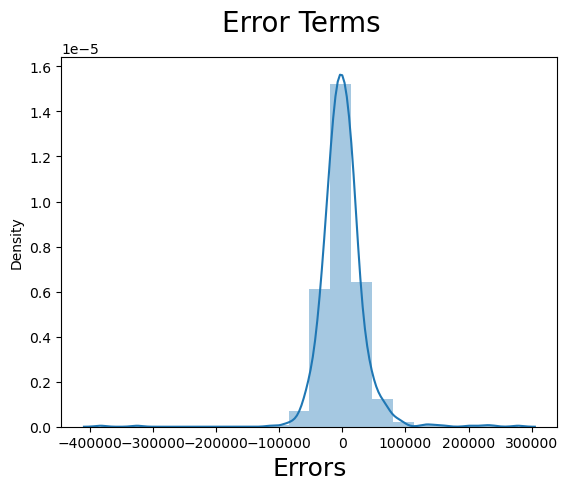

In [473]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_cnst), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

### Evaluate R2 of Train dataset

In [474]:
#evalate model
r2 = r2_score(y_true = y_train,y_pred = y_train_cnst)
round(r2,2)

0.8

In [475]:
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_train - y_train_cnst))
print(rss)
mse = mean_squared_error(y_train, y_train_cnst)
print(mse)
rmse = mse**0.5
print(rmse)

1284480214437.9604
1258060934.8070133
35469.15469541124


In [476]:
# Residual analysis
y_res = (y_train - y_train_cnst)
#y_res

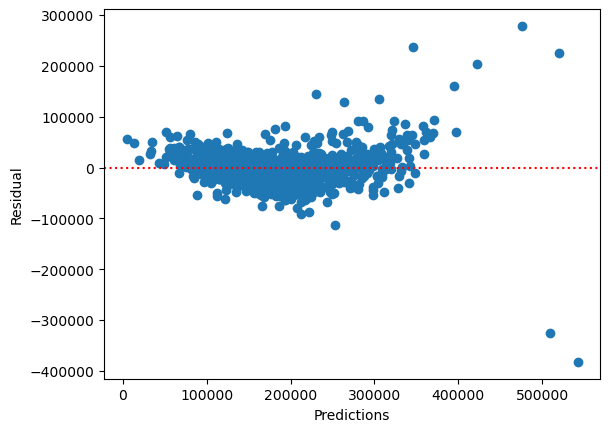

In [477]:
# data['res'] = y_res
plt.scatter( y_train_cnst , y_res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.show()

### Predictoin adn Evaluation on Test Data

In [478]:
#scale Test set
df_test[num_vars] = scaler.transform(df_test[num_vars])
df_test.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
1436,-0.433386,-0.144614,-1.496155,0.384025,-0.679020,-0.558025,-0.699764,-0.635533,-0.653302,0.665348,0.361022,-0.293313,-0.703973,-0.431488,-1.181447,-0.765928,-0.789230,-0.124502,-1.230557,-0.837450,-0.247791,-1.028080,-0.753316,0.175669,-0.234155,-0.776063,-0.937484,-0.927153,-0.985354,0.232304,0.306009,0.264038,-0.744598,-0.710899,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.469175,120500,-0.016404,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
57,0.880036,0.112107,0.648310,-0.532073,0.923321,-0.558025,1.051361,0.614716,-0.653302,-1.226909,-0.964030,-0.293313,0.660517,-0.440205,0.871757,-0.775986,1.186484,-0.124502,0.379709,-0.837450,-0.247791,0.784821,1.244440,0.175669,-0.234155,0.741868,0.308833,-0.927153,-0.985354,0.298247,0.306009,0.438477,-0.744598,0.347093,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,0.622834,196500,-1.137362,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
780,-0.297515,-0.253806,0.648310,-0.532073,0.534875,-0.355087,-0.699764,0.614716,-0.653302,-1.226909,-0.964030,-0.293313,1.501060,0.381373,-0.154845,0.212191,-0.789230,-0.124502,-0.498789,-0.837450,-0.247791,0.784821,-0.753316,0.175669,-0.234155,-0.776063,-0.314326,0.622148,0.658513,0.278464,0.306009,-0.329996,1.023633,-0.393502,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,

In [479]:
df_test.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.0,439.0,439.000000,439.0,439.000000,439.000000,439.0,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000
mean,0.044381,0.008

In [480]:
#create y_test and X_test
y_test = df_test.pop('SalePrice')
X_test = df_test

In [481]:
#trained model columns
X_train_new.columns

Index(['OverallQual', 'BsmtFinSF1', '1stFlrSF', '2ndFlrSF', 'KitchenQual', 'GarageCars', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'HouseStyle_1Story', 'Exterior1st_Stucco', 'Exterior2nd_BrkFace', 'Exterior2nd_ImStucc', 'GarageType_NA'], dtype='object')

In [482]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [483]:
#Running the Linear Model
test_lm = sm.OLS(y_test,X_test_new).fit()

In [484]:
#check summary()
test_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     117.2
Date:                Fri, 21 Apr 2023   Prob (F-statistic):          1.18e-147
Time:                        12:42:06   Log-Likelihood:                -5197.1
No. Observations:                 439   AIC:                         1.043e+04
Df Residuals:                     421   BIC:                         1.050e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.765e+05   3910.717     45.127      0.000    1.69e+05    1.84e+05
OverallQual           2.631e+04   2986.437      8.809      0.000    2.04e+04    3.22e+04
BsmtFinSF1            1.461e+04   2001.983      7.296      0.000    1.07e+04    1.85e+04
1stFlrSF              2.621e+04   2700.845      9.703      0.000    2.09e+04    3.15e+04
2ndFlrSF              2.631e+04   3251.793      8.091      0.000    1.99e+04    3.27e+04
KitchenQual           1.335e+04   2248.042      5.940      0.000    8933.806    1.78e+04
GarageCars            1.276e+04   2702.156      4.721      0.000    7445.021    1.81e+04
MSSubClass_120       -1.316e+04   8259.041     -1.593      0.112   -2.94e+04    3077.845
MSSubClass_180        4074.6122   1.88e+04      0.217      0.829   -3.29e+04    4.11e+04
MSZoning_RM          -7598.4760   5136.972     -1.479      0.140   -1.77e+04    2498.832
LotShape_IR3         -1.093e+04   3.46e+04     -0.316      0.752   -7.89e+04     5.7e+04
Neighborhood_Crawfor  1.622e+04   8387.557      1.934      0.054    -267.757    3.27e+04
Neighborhood_SawyerW -1.166e+04   9535.742     -1.223      0.222   -3.04e+04    7081.975
HouseStyle_1Story     1.229e+04   6436.754      1.910      0.057    -360.127    2.49e+04
Exterior1st_Stucco   -1558.3765   1.56e+04     -0.100      0.920   -3.22e+04     2.9e+04
Exterior2nd_BrkFace  -4675.9523   1.18e+04     -0.397      0.692   -2.78e+04    1.85e+04
Exterior2nd_ImStucc   2.494e+04   2.45e+04      1.018      0.309   -2.32e+04    7.31e+04
GarageType_NA         2.243e+04   9072.321      2.473      0.014    4602.224    4.03e+04
==============================================================================
Omnibus:                      149.321   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1093.873
Skew:                           1.258   Prob(JB):                    2.94e-238
Kurtosis:                      10.312   Cond. No.                         34.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [485]:
# Making predictions
y_pred = lm.predict(X_test_new)

### calculate r2 score of Test model


In [486]:
#evalate model
r2 = r2_score(y_true = y_test,y_pred = y_pred)
round(r2,2)

0.81

In [488]:
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_test - y_pred))
print(rss)
mse = mean_squared_error(y_test, y_pred)
print(mse)
rmse = mse**0.5
print(rmse)

526649943500.10205
1199658185.6494353
34636.08213481189


In [489]:
#drop the const
X_test_new = X_test_new.drop(['const'], axis=1)

In [490]:
#check final VIf of 9 columns
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,OverallQual,2.58
5,GarageCars,2.46
12,HouseStyle_1Story,2.02
3,2ndFlrSF,2.01
2,1stFlrSF,2.00
4,KitchenQual,1.96
16,GarageType_NA,1.66
1,BsmtFinSF1,1.31
6,MSSubClass_120,1.29
8,MSZoning_RM,1.27


Text(0, 0.5, 'y_pred')

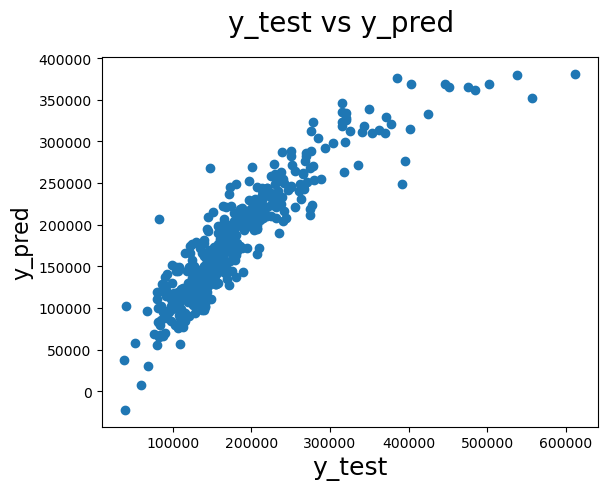

In [491]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [492]:
X_train_new.columns

Index(['OverallQual', 'BsmtFinSF1', '1stFlrSF', '2ndFlrSF', 'KitchenQual', 'GarageCars', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'HouseStyle_1Story', 'Exterior1st_Stucco', 'Exterior2nd_BrkFace', 'Exterior2nd_ImStucc', 'GarageType_NA'], dtype='object')

In [493]:
#final dataframe 
final_df = house_data[['OverallQual', 'BsmtFinSF1', '1stFlrSF', '2ndFlrSF', 'KitchenQual', 'GarageCars', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'HouseStyle_1Story', 'Exterior1st_Stucco', 'Exterior2nd_BrkFace', 'Exterior2nd_ImStucc', 'GarageType_NA']]
final_df.head()

,OverallQual,BsmtFinSF1,1stFlrSF,2ndFlrSF,KitchenQual,GarageCars,MSSubClass_120,MSSubClass_180,MSZoning_RM,LotShape_IR3,Neighborhood_Crawfor,Neighborhood_SawyerW,HouseStyle_1Story,Exterior1st_Stucco,Exterior2nd_BrkFace,Exterior2nd_ImStucc,GarageType_NA
0,7,706,856,854,3,2,0,0,0,0,0,0,0,0,0,0,0
1,6,978,1262,0,2,2,0,0,0,0,0,0,1,0,0,0,0
2,7,486,920,866,3,2,0,0,0,0,0,0,0,0,0,0,0
3,7,216,961,756,3,3,0,0,0,0,1,0,0,0,0,0,0
4,8,655,1145,1053,3,3,0,0,0,0,0,0,0,0,0,0,0


### Final evalution
No of Variables = 17 i.e. 'OverallQual', 'BsmtFinSF1', '1stFlrSF', '2ndFlrSF', 'KitchenQual', 'GarageCars', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'HouseStyle_1Story', 'Exterior1st_Stucco', 'Exterior2nd_BrkFace', 'Exterior2nd_ImStucc', 'GarageType_NA'

VIF < 5

p-value < 0.15

r2 score for Train Data set model = 0.80

r2 score for Test Data set model = 0.81

In [494]:
y_pred_train = lm.predict(X_train_lm)
# y_pred_test = test_lm.predict(X_test_new)
y_pred_test = y_pred

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.7987293801123365
0.8136230817324043
1284480214437.9604
526649943500.10205
1258060934.8070133
1199658185.6494353


### Ridge Regression

In [495]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [496]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 50}


In [507]:
#Fitting Ridge model for alpha = 50 and printing coefficients which have been penalised
alpha = 50
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)
print(ridge.coef_)

[ 27800.48035966   9327.16197947  20598.11222776  19981.09384531
  12891.8527033   12640.86081928  -5605.15159879   2534.1365168
 -11995.89807703  -4835.25309581   6526.35069963  -6118.26542537
   8814.81477752  -8482.3317858    3087.1012336    2722.10404539
   9996.52258513]


In [508]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.790435374307814
0.8127316508513056
1337411369319.3276
529168882151.5652
1309903397.9621232
1205396086.9056156


### Lasso

In [499]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [500]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 500}


In [501]:
#Fitting Ridge model for alpha = 100 and printing coefficients which have been penalised

alpha =100

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 

Lasso(alpha=100)

In [502]:
lasso.coef_

array([ 29207.96461122,   9569.49058185,  20314.19578989,  23245.72894669,
        12021.29126828,  13964.66907405, -10302.03425172,  13009.73240001,
       -14150.61293912, -20683.23063837,  15236.48303235, -11165.83697709,
        16030.08483393, -26113.26696988,   7348.12711027,   7884.91485427,
        21778.52203073])

In [503]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.7975477752988888
0.8154294069460215
1292021046800.9023
521545764932.62256
1265446666.7981415
1188031355.1995957


In [504]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),7.987294e-01,7.967947e-01,7.975478e-01
1,R2 Score (Test),8.136231e-01,8.155334e-01,8.154294e-01
2,RSS (Train),1.284480e+12,1.296827e+12,1.292021e+12
3,RSS (Test),5.266499e+11,5.212518e+11,5.215458e+11
4,MSE (Train),3.546915e+04,3.563921e+04,3.557312e+04
5,MSE (Test),3.463608e+04,3.445812e+04,3.446783e+04


### Lets observe the changes in the coefficients after regularization

In [506]:
betas = pd.DataFrame(index=X.columns)
betas.rows = X.columns
betas['Linear'] = lm.params
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_
pd.set_option('display.max_rows', None)
betas.head(68)

,Linear,Ridge,Lasso
OverallQual,29435.871410,28953.792030,29207.964611
BsmtFinSF1,9682.967105,9527.444276,9569.490582
1stFlrSF,19996.467116,20267.532557,20314.195790
2ndFlrSF,24213.230001,22705.874633,23245.728947
KitchenQual,11813.158144,12279.081240,12021.291268
GarageCars,14585.834859,13714.713842,13964.669074
MSSubClass_120,-12818.619878,-10067.516966,-10302.034252
MSSubClass_180,32294.166209,11014.130784,13009.732400
MSZoning_RM,-14970.344101,-14148.036153,-14150.612939
LotShape_IR3,-32457.187632,-15270.862766,-20683.230638


### Question 1

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

In [509]:
#earlier for Ridge alpha = 50 now take 100
alpha = 100
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)
print(ridge.coef_)
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

[26697.92910031  9244.40078603 20325.16027958 18102.22078974
 13296.15192011 12476.31967908 -3597.0774206   1053.39800973
 -9997.9960132  -2523.12713024  4097.39052855 -3852.30614517
  5485.65325312 -4801.28628917  1761.82573258  1453.08818286
  6063.9107775 ]
0.7855300593022636
0.8085186431102981


In [ ]:
# Double Ridge - Coefficients increased, R2 dropped from 0.812 to 0.785

In [510]:
#earlier for Lasso alpha = 100 now take 200
alpha =200

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 
print(lasso.coef_)
y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

[ 29029.16135598   9390.14835872  20628.3183789   22381.49963073
  12178.06772383  13347.75279228  -7786.4523073       0.
 -13554.92480679  -8808.33673224  11194.74124246  -8870.24839452
  13830.55309126 -20922.54211067      0.              0.
  18686.21097237]
0.7947266231847538
0.8151823939558853


### As alpha value increased more feautrues removed from model. But r2score is also dropped in both test and train data

### Question 2

You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

#### Ans

We can go ahead with Ridge as it will help in reducing multicoliniearity

### Question 4

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [518]:
# Top 5 features - OverallQual, GarageCars, HouseStyle_1Story, 2ndFlrSF, 1stFlrSF..lets drop and rebuild
X_train_new = X_train_new.drop(['OverallQual', 'GarageCars', 'HouseStyle_1Story', '2ndFlrSF', '1stFlrSF'], axis=1)

In [519]:
X_test_new = X_test_new.drop(['OverallQual', 'GarageCars', 'HouseStyle_1Story', '2ndFlrSF', '1stFlrSF'], axis=1)

In [520]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [521]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 500}


In [522]:
#Fitting Ridge model for alpha = 500 and printing coefficients which have been penalised

alpha =500

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 

Lasso(alpha=500)

In [523]:
lasso.coef_

array([ 16747.97632193,  45490.7006346 ,  -5752.91014718,     -0.        ,
       -26526.65684464,     -0.        ,  13606.97971451,  -5203.14446003,
           -0.        ,      0.        ,      0.        , -14170.18071585])

In [524]:
y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

0.5128919193376389
0.5379982074990362


#### After dropping the top 5 features model r2 score is very low i.e. 51% for Train and 53% for Test.

In [525]:
X_train_new.columns

Index(['BsmtFinSF1', 'KitchenQual', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM', 'LotShape_IR3', 'Neighborhood_Crawfor', 'Neighborhood_SawyerW', 'Exterior1st_Stucco', 'Exterior2nd_BrkFace', 'Exterior2nd_ImStucc', 'GarageType_NA'], dtype='object')

#### Next top 5 features after dropping 5 main predictors are 'BsmtFinSF1', 'KitchenQual', 'MSSubClass_120', 'MSSubClass_180', 'MSZoning_RM'